In [2]:
import statsmodels
from statsmodels.tsa.stattools import acf, ccf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics import utils
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import statsmodels.api as sm
from statsmodels.graphics.api import qqplot
import os

import sklearn
import torch


from torch.autograd import Variable
from sklearn.preprocessing import StandardScaler


ENSO_DIR = '../data/'

In [3]:
def mrse(actuals, preds):
    denom = np.sqrt(np.sum(np.square(actuals - np.mean(actuals))))
    num = np.sqrt(np.sum(np.square(actuals - preds)))
    return 1.0*num/denom

def re(actuals, preds):
    denom = np.sqrt(np.sum(np.square(actuals)))
    num = np.sqrt(np.sum(np.square(actuals - preds)))
    return 1.0*num/denom

In [4]:
filename = 'nino34_data.txt'
# First enso
data = open(ENSO_DIR + filename)
data_dict = {}

for line in data.readlines()[1:-3]:
    
    tokens = line.split(' ')
    values = []
    for token in tokens:
        if token == '':
            pass
        else:
            if '\n' in token:
                token = token[:-2]
            values.append(float(token))
    data_dict.update({values[0]:values[1:]})

filtered_data = {int(year): data_dict[year] for year in data_dict.keys() if year >= 1950 and year <=2008 }


In [5]:
filename = 'nino34_anomalies.txt'
anomaly_data = open(DATA_DIR + filename)
anomaly_data_dict = {}

for line in anomaly_data.readlines():  
    _,year,value = line.split(' ')
    value = float(value[:-2])
    year = int(float(year))
    if year in anomaly_data_dict:
        anomaly_data_dict[year]=anomaly_data_dict[year]+[value]
    else:
        anomaly_data_dict.update({year:[value]})

In [6]:
filtered_ts = np.array([])
filtered_ts = np.array([np.concatenate((filtered_ts,val)) for val in filtered_data.values()]).flatten()

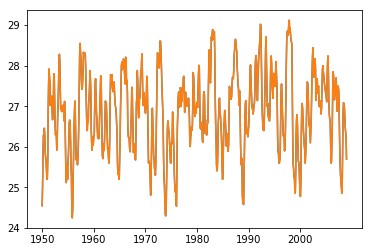

In [8]:
filtered_anomalies = np.array([])
filtered_anomalies = np.array([np.concatenate((filtered_anomalies,val)) for val in anomaly_data_dict.values()]).flatten()
plt.plot(filtered_ts)
plt.xticks(range(0,708+1,12*10),range(1950,2008+1,10))
plt.show()

In [9]:
def get_data(data,years,subtract_mean=False,means=None):
    if subtract_mean == True:
        assert means is not None
    filtered_data = {int(year): data[year] for year in data.keys() if year in years }
    filtered_ts = np.array([])
    if subtract_mean:
        filtered_ts = np.array([np.concatenate((filtered_ts,val-means)) for val in filtered_data.values()]).flatten()
    else:
        filtered_ts = np.array([np.concatenate((filtered_ts,val)) for val in filtered_data.values()]).flatten()
    return filtered_ts

train_test_ratio = 0.8
years = np.array(list(filtered_data.keys()))
print('Total years available')
print(years)
print(f'Train Test ratio: {train_test_ratio}')
training_years = years[:int(train_test_ratio*len(years))]
print(f'No of years in training: {len(training_years)}')
print(training_years)
testing_years = years[int(train_test_ratio*len(years)):]
print(f'No of years in testing: {len(testing_years)}')
print(testing_years)

means = np.zeros(12)
for key,value in filtered_data.items():
    if int(key) in training_years:
        means += np.array(value)
means /= len(training_years)
print(means)

Total years available
[1950 1951 1952 1953 1954 1955 1956 1957 1958 1959 1960 1961 1962 1963
 1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977
 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991
 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008]
Train Test ratio: 0.8
No of years in training: 47
[1950 1951 1952 1953 1954 1955 1956 1957 1958 1959 1960 1961 1962 1963
 1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977
 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991
 1992 1993 1994 1995 1996]
No of years in testing: 12
[1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008]
[26.43340426 26.63085106 27.10021277 27.51       27.61638298 27.42085106
 26.98765957 26.58851064 26.47744681 26.43723404 26.42957447 26.37021277]


In [88]:
training_data = get_data(filtered_data,training_years,subtract_mean=False,means=means)
training_anomalies = get_data(anomaly_data_dict,training_years)

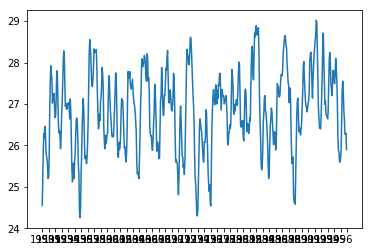

In [89]:
len(training_data),len(training_anomalies)
plt.plot(training_data)
plt.xticks(range(0,len(training_data)+1,12),training_years)
plt.show()

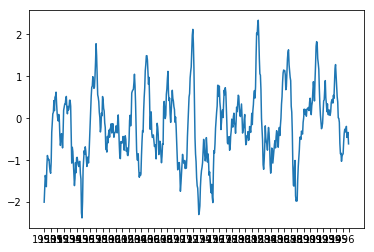

In [90]:
plt.plot(training_anomalies)
plt.xticks(range(0,len(training_anomalies)+1,12),training_years)
plt.show()

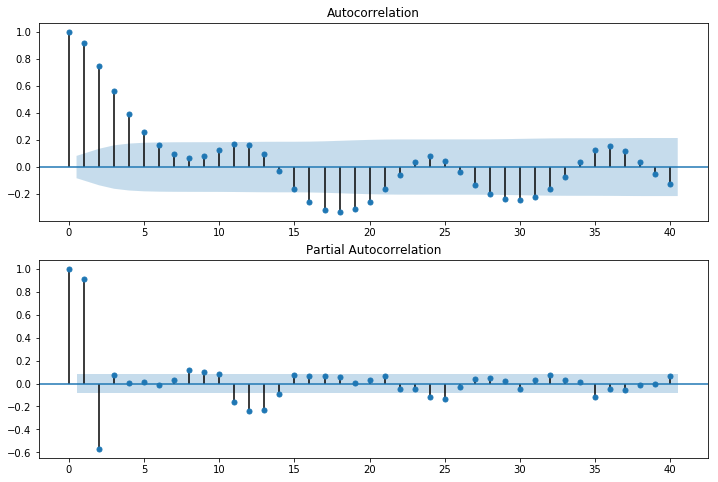

In [91]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(training_data, lags=40, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(training_data, lags=40, ax=ax2)
plt.show()

In [92]:
scaler = StandardScaler()
#scaled_training_data = scaler.fit_transform(training_data.reshape(-1, 1))
#scaled_test_data = scaler.transform(test_data.reshape(-1, 1))

#scaled_training_data = training_data - np.tile(means,int(len(training_data)/12))
scaled_training_data = scaler.fit_transform(training_data.reshape(-1, 1))
test_data = get_data(filtered_data,testing_years)
#test_anomalies = get_data(anomaly_data_dict,testing_years)
#scaled_test_data = test_data - np.tile(means,int(len(test_data)/12))
scaled_test_data = scaler.transform(test_data.reshape(-1, 1))

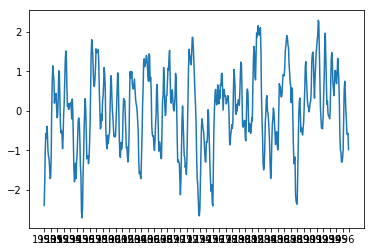

In [93]:
plt.plot(scaled_training_data)
#plt.plot(reqd_means)
plt.xticks(range(0,len(training_data)+1,12),training_years)
plt.show()

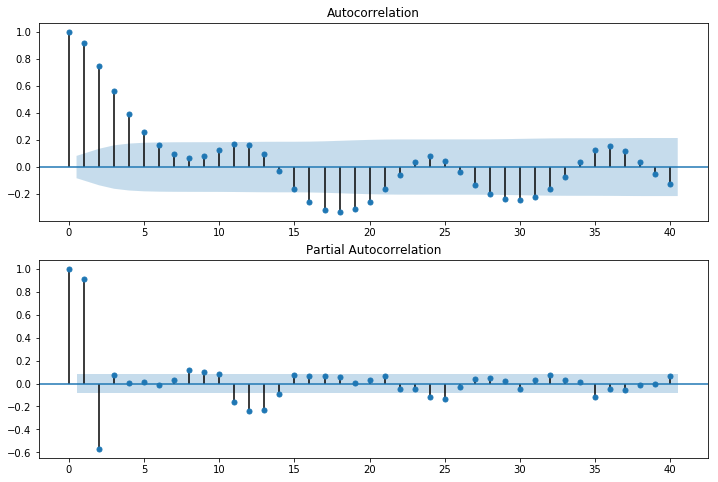

In [94]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(scaled_training_data, lags=40, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(scaled_training_data, lags=40, ax=ax2)
plt.show()

In [95]:
train_data_normalized = torch.FloatTensor(training_data).view(-1)
train_window = 6

def create_inout_sequences(input_data, tw):
    inout_seq = []
    L = len(input_data)
    for i in range(L-tw):
        train_seq = input_data[i:i+tw]
        train_label = input_data[i+tw:i+tw+1]
        inout_seq.append((train_seq ,train_label))
    return inout_seq

train_inout_seq = create_inout_sequences(train_data_normalized, train_window)

train_inout_seq[:5]

[(tensor([24.5500, 25.0600, 25.8700, 26.2800, 26.1800, 26.4600]),
  tensor([26.2900])),
 (tensor([25.0600, 25.8700, 26.2800, 26.1800, 26.4600, 26.2900]),
  tensor([25.8800])),
 (tensor([25.8700, 26.2800, 26.1800, 26.4600, 26.2900, 25.8800]),
  tensor([25.7400])),
 (tensor([26.2800, 26.1800, 26.4600, 26.2900, 25.8800, 25.7400]),
  tensor([25.6900])),
 (tensor([26.1800, 26.4600, 26.2900, 25.8800, 25.7400, 25.6900]),
  tensor([25.4700]))]

In [96]:
test_data_normalized = torch.FloatTensor(test_data).view(-1)

test_inout_seq = create_inout_sequences(test_data_normalized, train_window)

test_inout_seq[:5]

[(tensor([26.0100, 26.3800, 27.0400, 27.9800, 28.5800, 28.8200]),
  tensor([28.8600])),
 (tensor([26.3800, 27.0400, 27.9800, 28.5800, 28.8200, 28.8600]),
  tensor([28.7500])),
 (tensor([27.0400, 27.9800, 28.5800, 28.8200, 28.8600, 28.7500]),
  tensor([28.8500])),
 (tensor([27.9800, 28.5800, 28.8200, 28.8600, 28.7500, 28.8500]),
  tensor([29.0800])),
 (tensor([28.5800, 28.8200, 28.8600, 28.7500, 28.8500, 29.0800]),
  tensor([29.1200]))]

In [97]:
print(f'scaled_training_data: {len(scaled_training_data)}\n\
scaled_test_data: {len(scaled_test_data)}\n\
training_data: {len(training_data)}\n\
test_data: {len(test_data)}\n\
train_inout_seq: {len(train_inout_seq)}\n\
test_inout_seq: {len(test_inout_seq)}\n\
')

scaled_training_data: 564
scaled_test_data: 144
training_data: 564
test_data: 144
train_inout_seq: 558
test_inout_seq: 138



In [100]:
import torch.nn as nn
import torch.optim as optim
import sklearn
import torch
import torch.nn

from torch.autograd import Variable
from torch.optim.lr_scheduler import ReduceLROnPlateau
from sklearn.preprocessing import StandardScaler,MinMaxScaler
import seaborn as sns
class LSTM(nn.Module):
    def __init__(self, input_size=1, hidden_layer_size=10, num_hidden_layers=1, output_size=1):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size

        self.lstm = nn.LSTM(input_size, hidden_layer_size, num_hidden_layers)

        self.linear = nn.Linear(hidden_layer_size, output_size)

    def forward(self, input_seq):
        #lstm_out, self.hidden_cell = self.lstm(input_seq.view(len(input_seq) ,1, -1), self.hidden_cell)
        format_input = input_seq.view(len(input_seq) ,1, -1)
        lstm_out,_ = self.lstm(format_input)
        predictions = self.linear(lstm_out.view(len(input_seq), -1))
        return predictions[-1]

In [101]:
input_size=1
num_hidden_layers=1
hidden_layer_size=64
output_size=1

model = LSTM(input_size,hidden_layer_size,num_hidden_layers,output_size)
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = ReduceLROnPlateau(optimizer, 'min', verbose=True, patience=4)
print(model)

LSTM(
  (lstm): LSTM(1, 64)
  (linear): Linear(in_features=64, out_features=1, bias=True)
)


In [102]:
epochs = 150

for i in range(epochs):
    for seq, labels in train_inout_seq:
        optimizer.zero_grad()
#         model.hidden_cell = (torch.zeros(1, 1, model.hidden_layer_size),
#                         torch.zeros(1, 1, model.hidden_layer_size))

        y_pred = model(seq)

        single_loss = loss_function(y_pred, labels)
        single_loss.backward()
        optimizer.step()

    if i%25 == 1:
        print(f'epoch: {i:3} loss: {single_loss.item():10.8f}')

print(f'epoch: {i:3} loss: {single_loss.item():10.10f}')


epoch:   1 loss: 1.48284674
epoch:  26 loss: 1.13250017
epoch:  51 loss: 0.99695820
epoch:  76 loss: 0.04879410
epoch: 101 loss: 0.02265292
epoch: 126 loss: 0.02528537
epoch: 149 loss: 0.0332397558


In [103]:
train_window = 12
fut_pred = 12

test_inputs = train_data_normalized[-train_window:].tolist()
print(test_inputs)

model.eval()

for i in range(fut_pred):
    seq = torch.FloatTensor(test_inputs[-train_window:])
    with torch.no_grad():
#         model.hidden = (torch.zeros(1, 1, model.hidden_layer_size),
#                         torch.zeros(1, 1, model.hidden_layer_size))
        test_inputs.append(model(seq).item())
        
print(test_inputs[fut_pred:])

actual_predictions = scaler.inverse_transform(np.array(test_inputs[train_window:] ).reshape(-1, 1))
print(actual_predictions)

[25.690000534057617, 25.889999389648438, 26.670000076293945, 27.350000381469727, 27.549999237060547, 27.290000915527344, 26.850000381469727, 26.639999389648438, 26.270000457763672, 26.270000457763672, 26.290000915527344, 25.899999618530273]
[24.81068992614746, 23.20683479309082, 21.850433349609375, 21.006813049316406, 20.597553253173828, 20.417755126953125, 20.32990264892578, 20.285160064697266, 20.260656356811523, 20.24708366394043, 20.23996353149414, 20.236419677734375]
[[50.4284185 ]
 [48.90315718]
 [47.61322356]
 [46.81094324]
 [46.42173843]
 [46.25075096]
 [46.16720352]
 [46.12465346]
 [46.10135051]
 [46.08844292]
 [46.0816717 ]
 [46.0783015 ]]


In [123]:
def evaluate(rescale=True, display_plots=True):
    model.eval()
    scaled_predictions = []
    scaled_actuals = []
    for i in range(len(test_inout_seq)):
        seq = torch.FloatTensor(test_inout_seq[i][0])
        scaled_actuals.append(test_inout_seq[i][1].item())
        with torch.no_grad():
#             model.hidden = (torch.zeros(1, 1, model.hidden_layer_size),
#                             torch.zeros(1, 1, model.hidden_layer_size))
            scaled_predictions.append(model(seq).item())
    if rescale:
        actuals = scaler.inverse_transform(np.array(scaled_actuals).reshape(-1, 1))
        predictions = scaler.inverse_transform(np.array(scaled_predictions).reshape(-1, 1))
    else:
        actuals=scaled_actuals
        predictions=scaled_predictions
    a1 = actuals
    p1 = predictions
    #actuals = test_data
    if display_plots:
        plt.plot(actuals,label='Truth')
        plt.plot(predictions,label='Preds')
        plt.xticks(range(0,len(scaled_test_data)+1,12),testing_years)
        plt.legend()
        plt.show()
    actuals = np.array(actuals)
    predictions = np.array(predictions)
    test_mrse = mrse(actuals,predictions)
    test_re = re(actuals,predictions)
    test_error = error(actuals,predictions)
    print(f'Test MRSE: {test_mrse}\nTest RE: {test_re}\nTest ERROR: {test_error}')
    return test_mrse,test_re,test_error,a1,p1
    

LSTM(
  (lstm): LSTM(1, 64)
  (linear): Linear(in_features=64, out_features=1, bias=True)
)


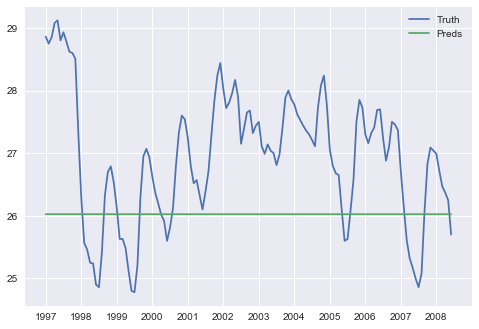

Test MRSE: 1.3223805155265533
Test RE: 0.050745264230002196
Test ERROR: 1.367076801375871


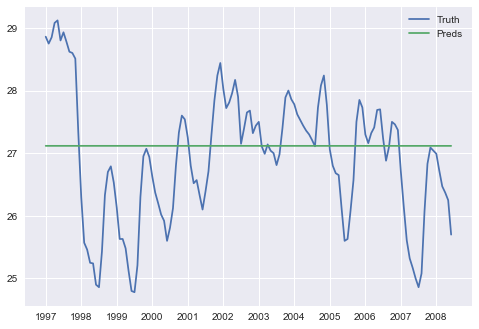

Test MRSE: 1.0177691254359218
Test RE: 0.039056052769212965
Test ERROR: 1.0521695867441259
epoch:   1 loss: 539.47729414


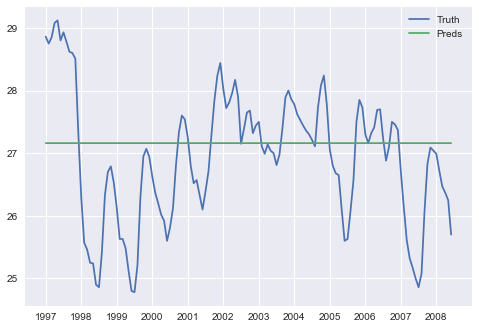

Test MRSE: 1.0265159966084987
Test RE: 0.03939170675354399
Test ERROR: 1.0612121010009938


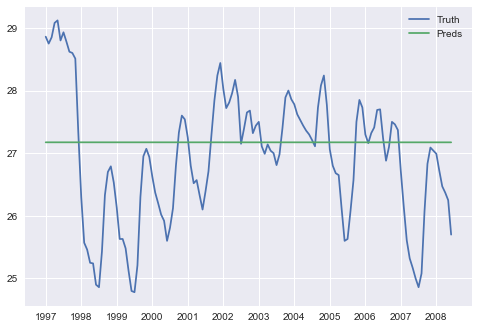

Test MRSE: 1.029385853476796
Test RE: 0.039501835149549615
Test ERROR: 1.064178958650402


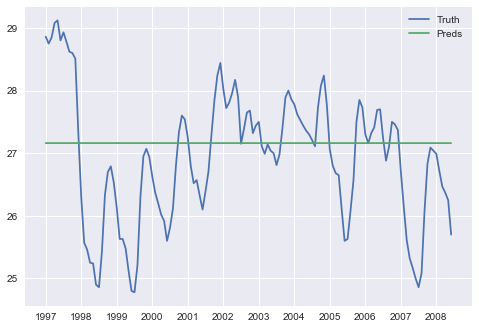

Test MRSE: 1.0265943032852856
Test RE: 0.039394711707835026
Test ERROR: 1.061293054433059


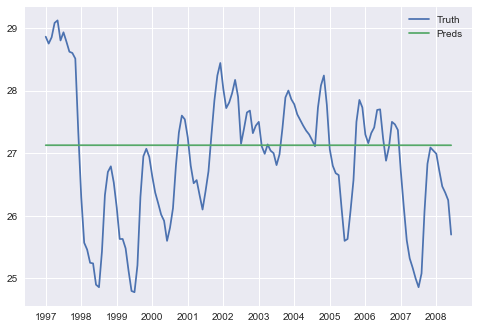

Test MRSE: 1.0195769804470194
Test RE: 0.03912542771776258
Test ERROR: 1.0540385470145655


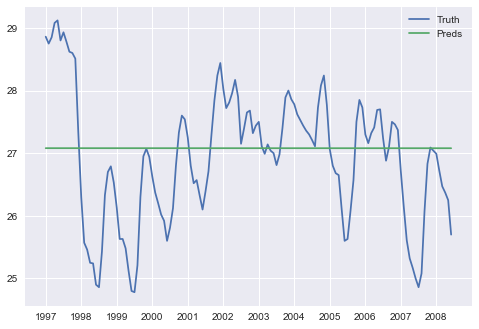

Test MRSE: 1.011511528200318
Test RE: 0.03881592262404124
Test ERROR: 1.045700483552794
epoch:   6 loss: 572.15648332


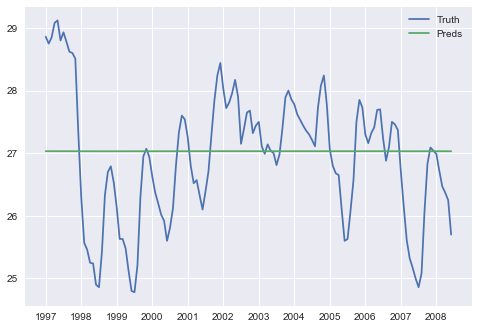

Test MRSE: 1.0053648952149048
Test RE: 0.038580050640669314
Test ERROR: 1.0393460951885765


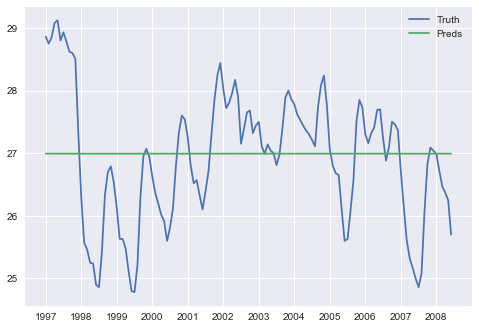

Test MRSE: 1.0019498814446761
Test RE: 0.03844900229710661
Test ERROR: 1.0358156544063333


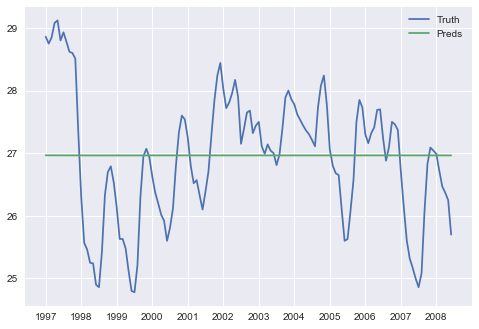

Test MRSE: 1.0004418569164457
Test RE: 0.0383911330966368
Test ERROR: 1.0342566588492725


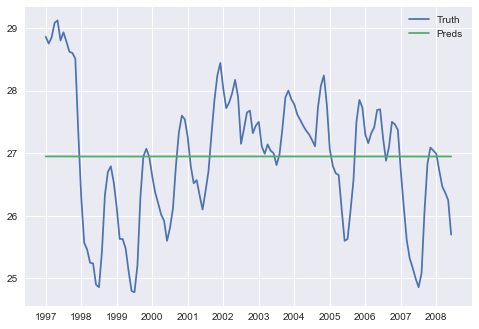

Test MRSE: 0.9998787207647523
Test RE: 0.03836952321016341
Test ERROR: 1.0336744887704206


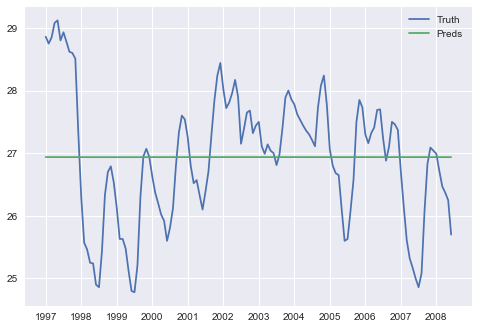

Test MRSE: 0.9997030418175756
Test RE: 0.03836278167511396
Test ERROR: 1.0334928718981546
epoch:  11 loss: 608.17607981


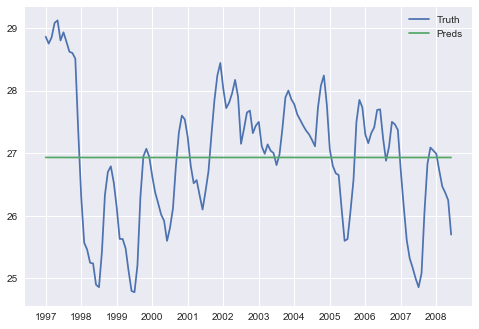

Test MRSE: 0.9996684423363992
Test RE: 0.03836145394849223
Test ERROR: 1.0334571029591082


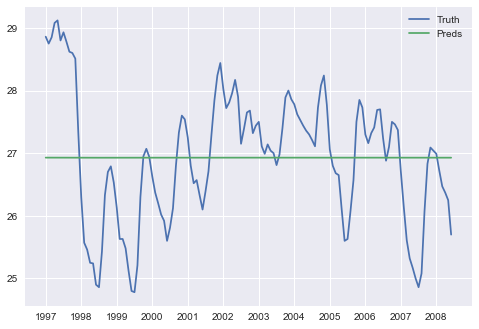

Test MRSE: 0.9996817678561488
Test RE: 0.0383619653043484
Test ERROR: 1.0334708788796563


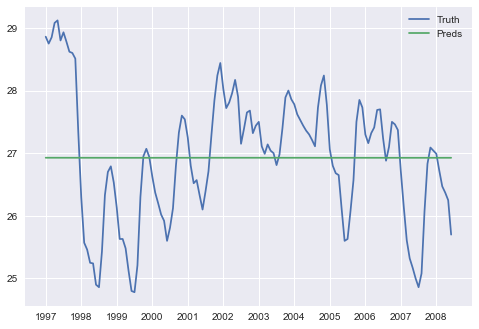

Test MRSE: 0.9997096981162621
Test RE: 0.03836303710509926
Test ERROR: 1.033499753178853


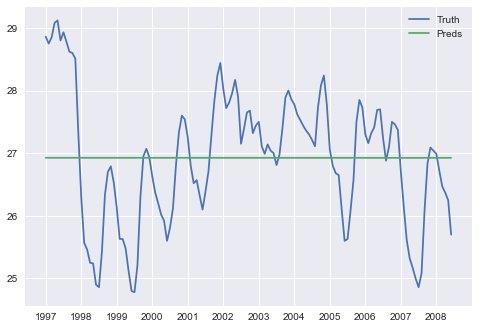

Test MRSE: 0.9997402488621377
Test RE: 0.03836420946483512
Test ERROR: 1.033531336535883


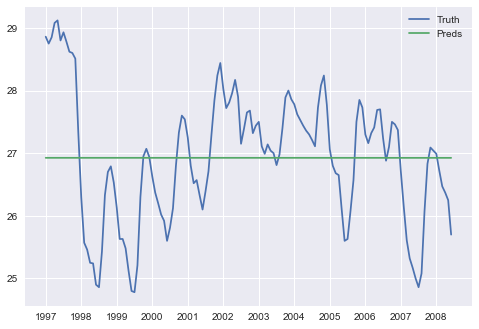

Test MRSE: 0.9997699106348629
Test RE: 0.038365347710957766
Test ERROR: 1.033562000872588
epoch:  16 loss: 611.87832253
Epoch    16: reducing learning rate of group 0 to 1.0000e-04.


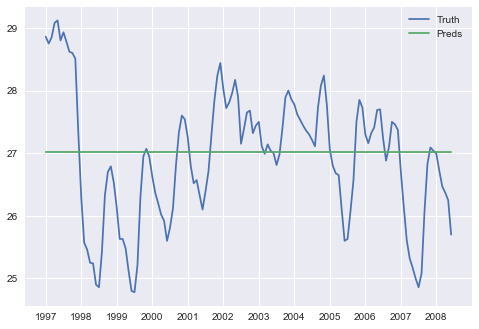

Test MRSE: 1.0042330794349257
Test RE: 0.03853661814136948
Test ERROR: 1.0381760241855078


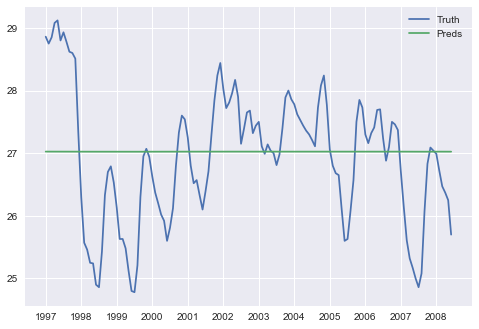

Test MRSE: 1.0046683706258854
Test RE: 0.03855332208266541
Test ERROR: 1.0386260281609274


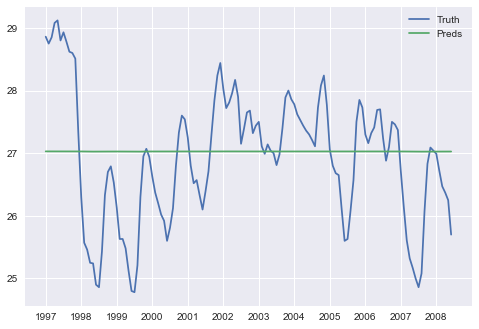

Test MRSE: 1.0044448289952101
Test RE: 0.03854474385651807
Test ERROR: 1.0383949308528155


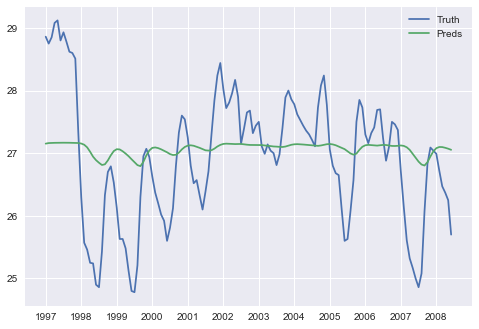

Test MRSE: 0.9526604050053302
Test RE: 0.03655755919407727
Test ERROR: 0.9848602002076137


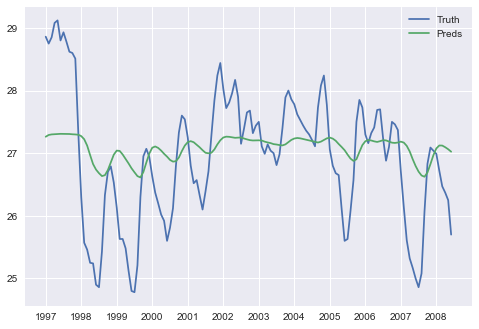

Test MRSE: 0.8986642108598493
Test RE: 0.03448549967175749
Test ERROR: 0.9290389418692134
epoch:  21 loss: 424.89215298


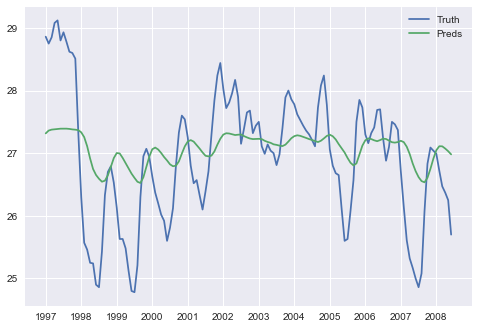

Test MRSE: 0.8662825543681273
Test RE: 0.03324288024748135
Test ERROR: 0.8955627896874577


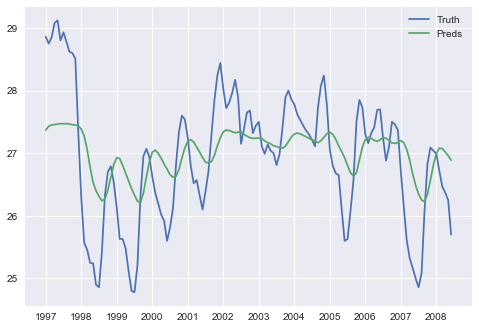

Test MRSE: 0.8036931503080473
Test RE: 0.030841063365173126
Test ERROR: 0.8308578720802852


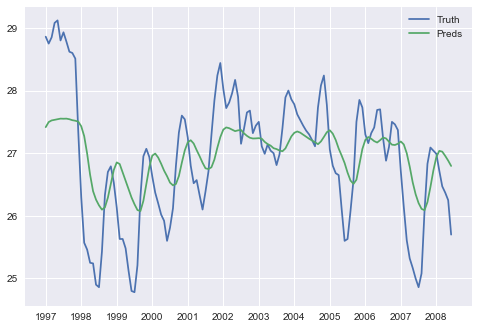

Test MRSE: 0.7625063614251322
Test RE: 0.029260554230238826
Test ERROR: 0.7882789752015914


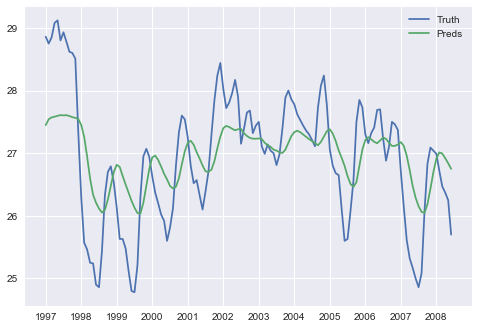

Test MRSE: 0.7417688936739036
Test RE: 0.028464770968052586
Test ERROR: 0.7668405837937322


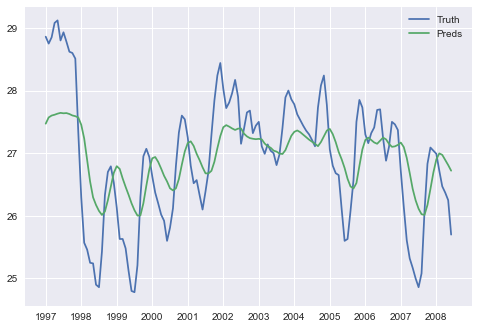

Test MRSE: 0.7258197692691312
Test RE: 0.027852736441942617
Test ERROR: 0.7503523811016802
epoch:  26 loss: 316.83715229


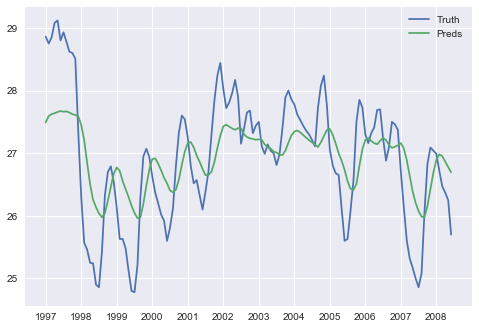

Test MRSE: 0.7111016186077721
Test RE: 0.0272879395203922
Test ERROR: 0.7351367589021297


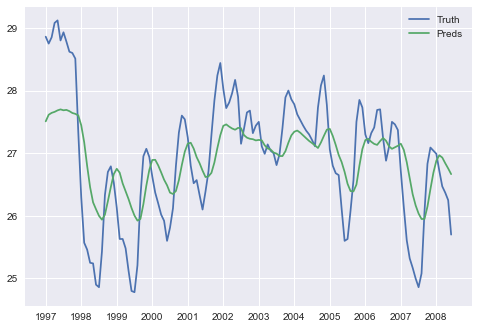

Test MRSE: 0.6971601402933788
Test RE: 0.02675294676111139
Test ERROR: 0.7207240604717517


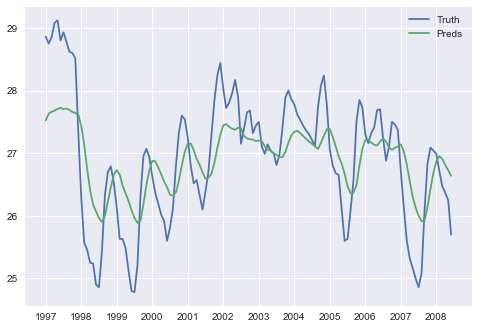

Test MRSE: 0.6842193720440695
Test RE: 0.02625635542719496
Test ERROR: 0.7073458959737912


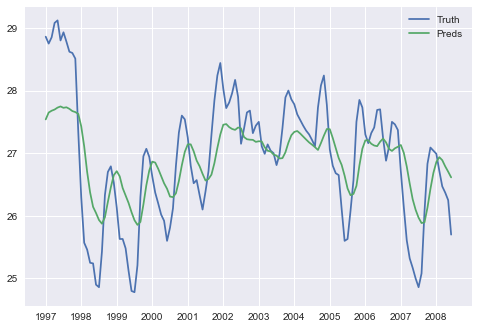

Test MRSE: 0.6724259456193002
Test RE: 0.025803792391763582
Test ERROR: 0.6951538533017048


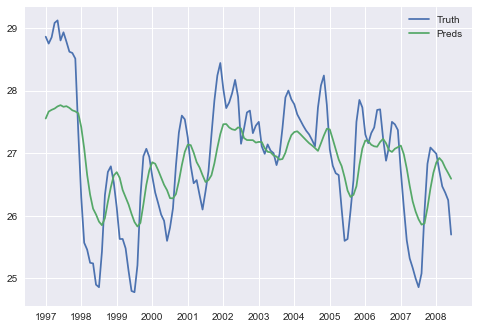

Test MRSE: 0.661817561300641
Test RE: 0.02539670437210275
Test ERROR: 0.6841869070015743
epoch:  31 loss: 273.54556585


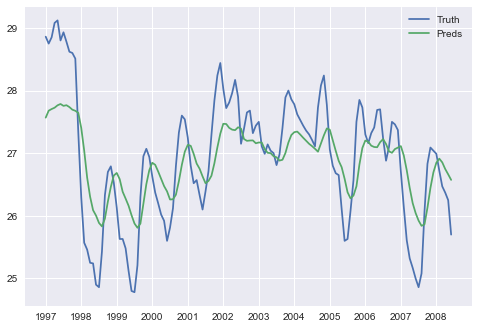

Test MRSE: 0.6523301323930631
Test RE: 0.025032632094021207
Test ERROR: 0.6743788042565878


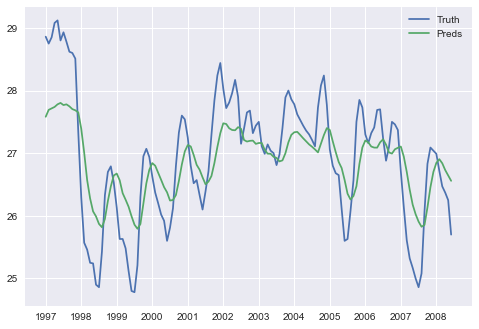

Test MRSE: 0.6437958231432361
Test RE: 0.024705134998579976
Test ERROR: 0.6655560364872365


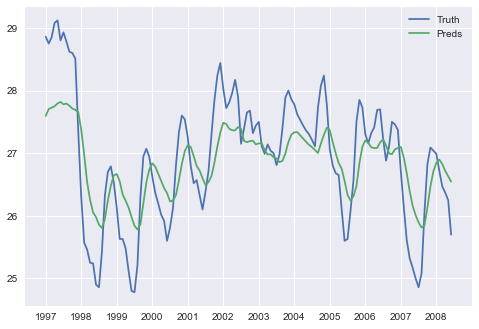

Test MRSE: 0.635965624418021
Test RE: 0.024404657565179306
Test ERROR: 0.6574611780847424


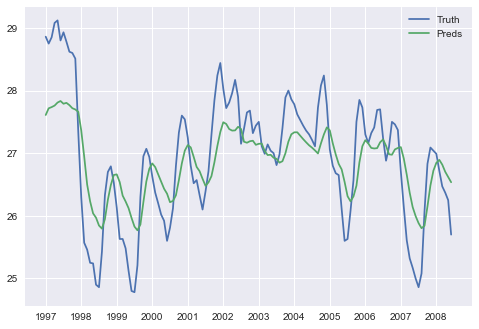

Test MRSE: 0.6285421119408767
Test RE: 0.024119786381927338
Test ERROR: 0.6497867518715074


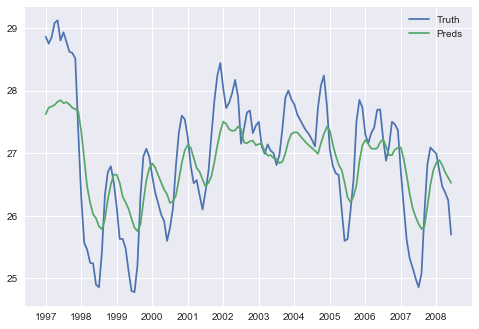

Test MRSE: 0.621266952021604
Test RE: 0.02384060810601935
Test ERROR: 0.6422656925129028
epoch:  36 loss: 243.76721061


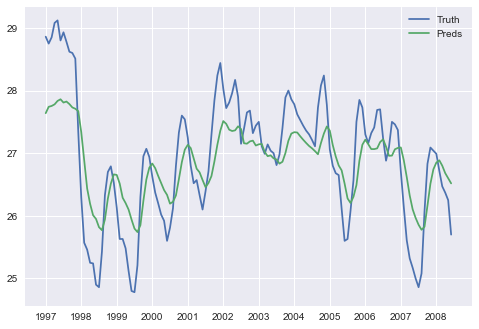

Test MRSE: 0.6140966316652441
Test RE: 0.023565452962076263
Test ERROR: 0.6348530162805177


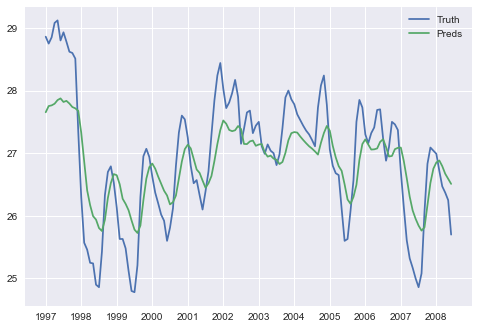

Test MRSE: 0.6070303081648138
Test RE: 0.023294288611910966
Test ERROR: 0.6275478519839849


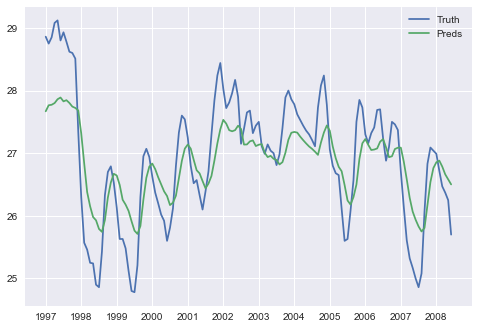

Test MRSE: 0.6000344428527947
Test RE: 0.02302582803675302
Test ERROR: 0.6203155273532764


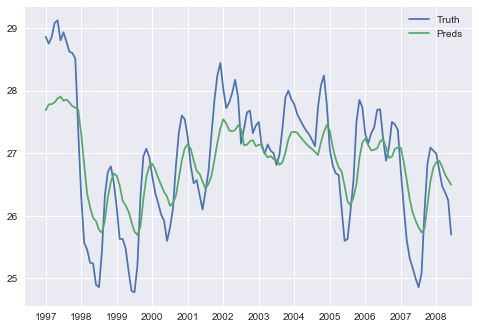

Test MRSE: 0.5930786828614711
Test RE: 0.02275890647027815
Test ERROR: 0.6131246635977783


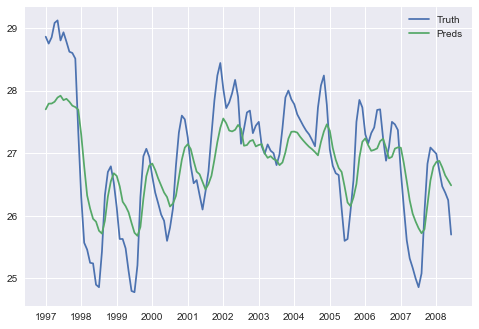

Test MRSE: 0.586144071340499
Test RE: 0.022492796458952073
Test ERROR: 0.6059556631281214
epoch:  41 loss: 218.43323772


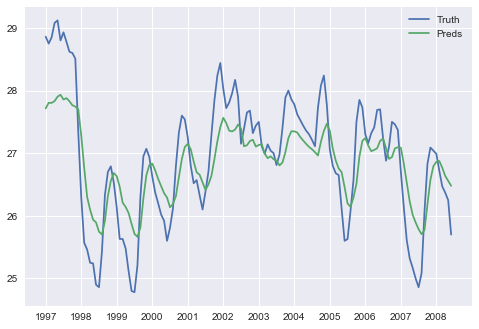

Test MRSE: 0.5792121793417085
Test RE: 0.02222679080705211
Test ERROR: 0.598789474100135


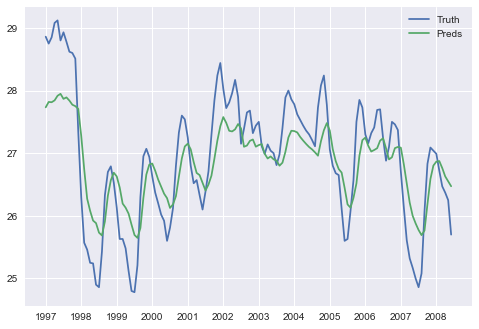

Test MRSE: 0.572263941740608
Test RE: 0.02196015790611263
Test ERROR: 0.5916063869906506


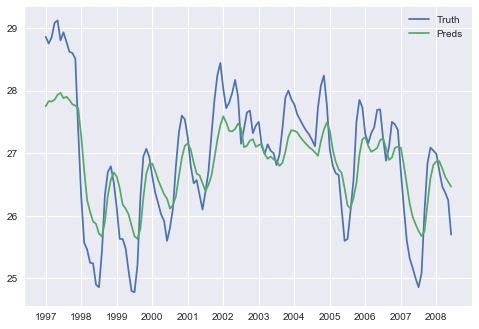

Test MRSE: 0.5652827822967601
Test RE: 0.021692261656545784
Test ERROR: 0.5843892652845052


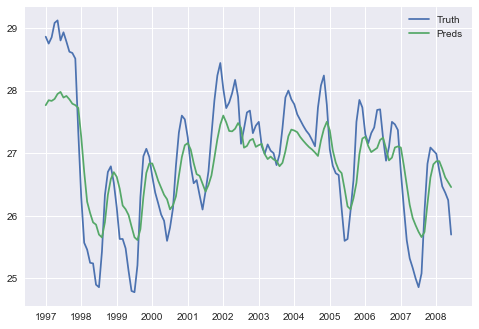

Test MRSE: 0.5582574076700656
Test RE: 0.021422668685717405
Test ERROR: 0.5771264339282034


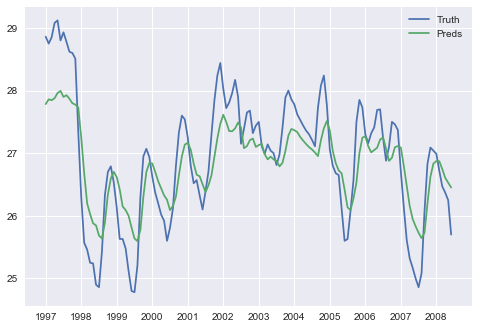

Test MRSE: 0.551180285641632
Test RE: 0.021151089950925
Test ERROR: 0.5698101061148545
epoch:  46 loss: 194.40485911


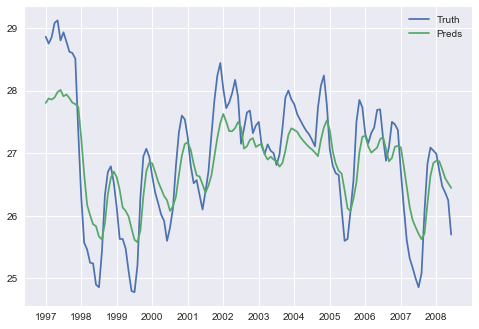

Test MRSE: 0.5440480673836581
Test RE: 0.020877396943657103
Test ERROR: 0.5624368198267219


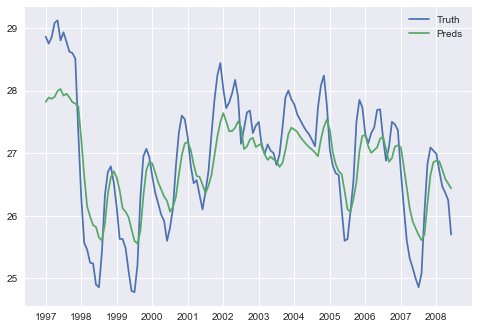

Test MRSE: 0.5368597303391518
Test RE: 0.02060155042413051
Test ERROR: 0.5550055179445232


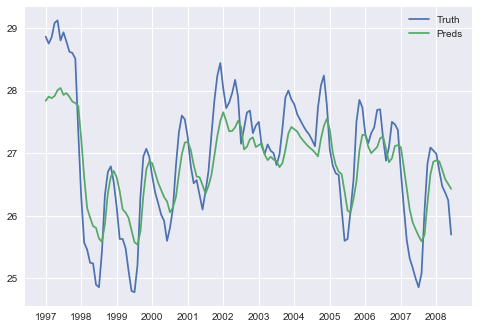

Test MRSE: 0.5296164484191359
Test RE: 0.02032359544021482
Test ERROR: 0.5475174140573178


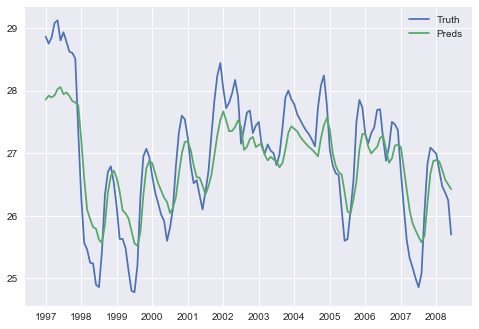

Test MRSE: 0.5223211035054494
Test RE: 0.020043642581754395
Test ERROR: 0.5399754874541682


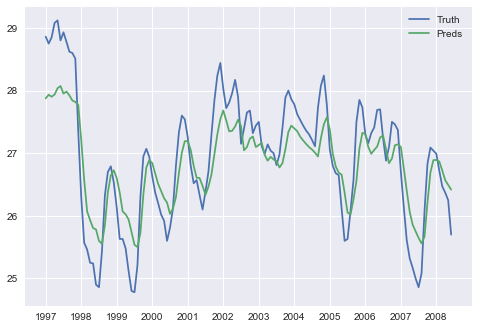

Test MRSE: 0.5149775010755612
Test RE: 0.019761837880815973
Test ERROR: 0.5323836722371768
epoch:  51 loss: 170.76799548


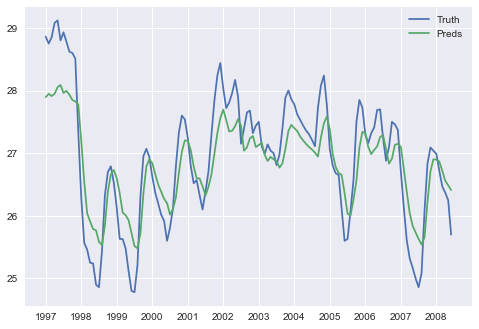

Test MRSE: 0.5075925248019649
Test RE: 0.019478445492667605
Test ERROR: 0.5247490847460532


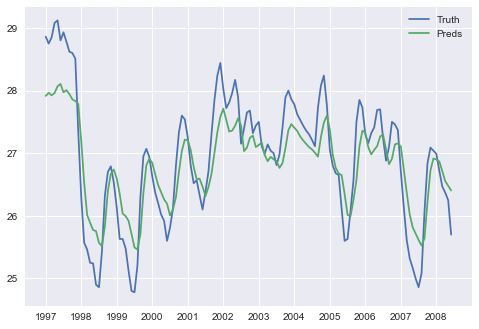

Test MRSE: 0.5001724164617356
Test RE: 0.01919370494036882
Test ERROR: 0.5170781777291088


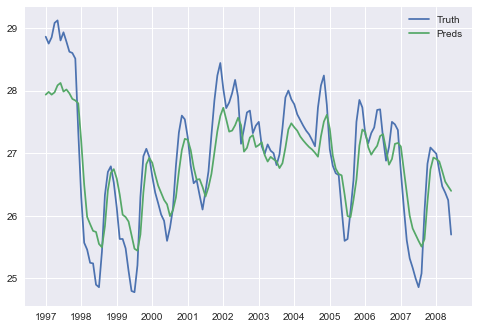

Test MRSE: 0.4927286964320402
Test RE: 0.01890805830891445
Test ERROR: 0.5093828609507293


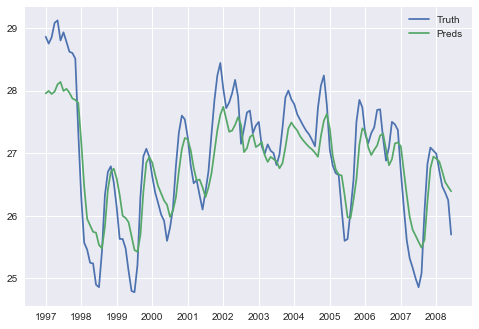

Test MRSE: 0.48527666714246886
Test RE: 0.018622092816449193
Test ERROR: 0.5016789540605935


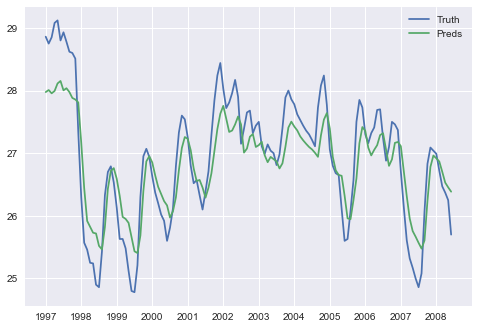

Test MRSE: 0.47784139028845934
Test RE: 0.01833677018491473
Test ERROR: 0.4939923658361171
epoch:  56 loss: 147.71604618


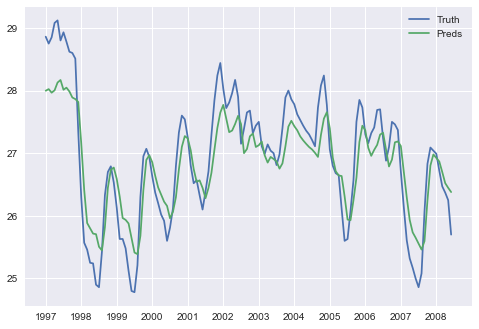

Test MRSE: 0.47046959911354813
Test RE: 0.01805388376407972
Test ERROR: 0.48637140909826343


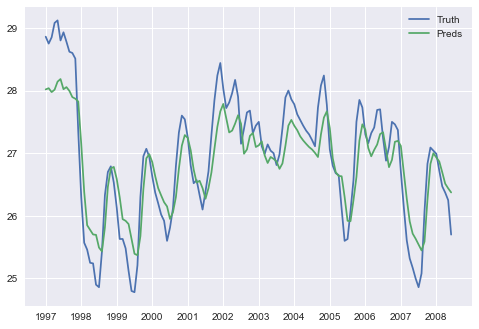

Test MRSE: 0.463224884475193
Test RE: 0.0177758738007766
Test ERROR: 0.47888182406702917


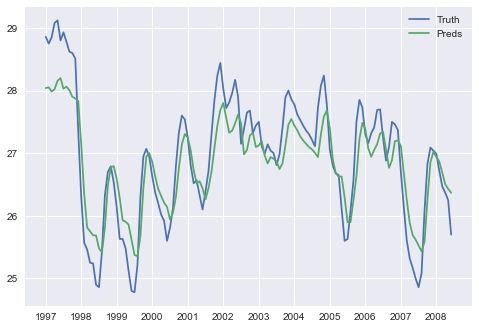

Test MRSE: 0.45617846050148675
Test RE: 0.017505473078576028
Test ERROR: 0.47159723189858144


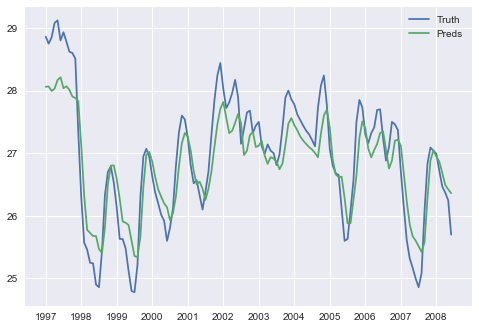

Test MRSE: 0.44939409108180844
Test RE: 0.017245128484268058
Test ERROR: 0.46458355169329424


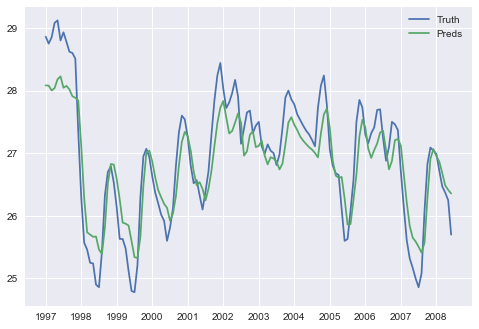

Test MRSE: 0.4429447829000254
Test RE: 0.016997641589276278
Test ERROR: 0.45791625775125633
epoch:  61 loss: 126.85620838


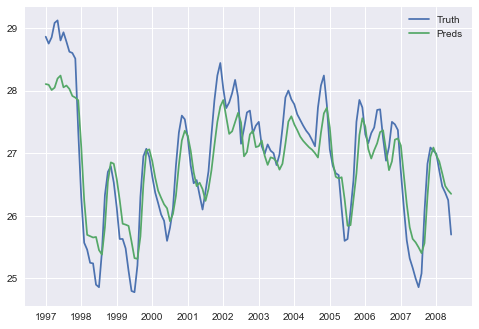

Test MRSE: 0.43689741899650747
Test RE: 0.016765578975243587
Test ERROR: 0.4516644937507219


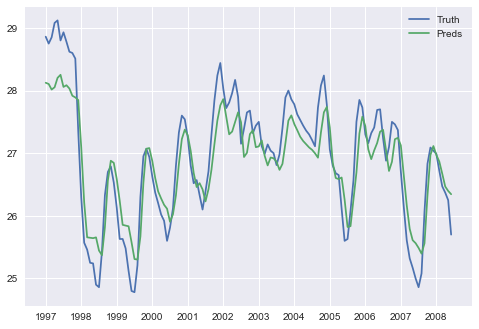

Test MRSE: 0.43130916662201724
Test RE: 0.016551134388380833
Test ERROR: 0.44588735918793876


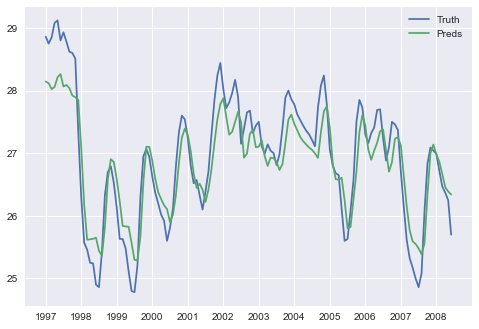

Test MRSE: 0.42620435073406965
Test RE: 0.01635524127891811
Test ERROR: 0.44061000120075666


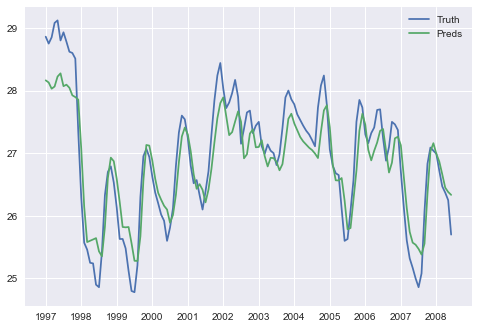

Test MRSE: 0.42157330644523433
Test RE: 0.01617752876475254
Test ERROR: 0.435822428229833


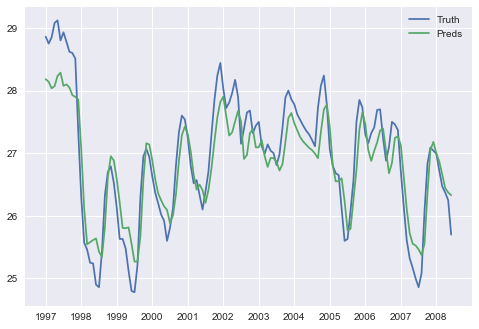

Test MRSE: 0.4173869021525838
Test RE: 0.016016878944591223
Test ERROR: 0.4314945240279293
epoch:  66 loss: 111.86965186


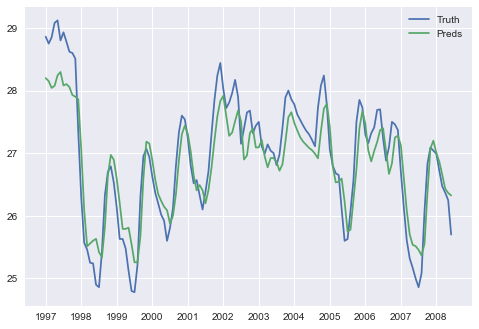

Test MRSE: 0.4135932094613247
Test RE: 0.015871299109010605
Test ERROR: 0.42757260502740296


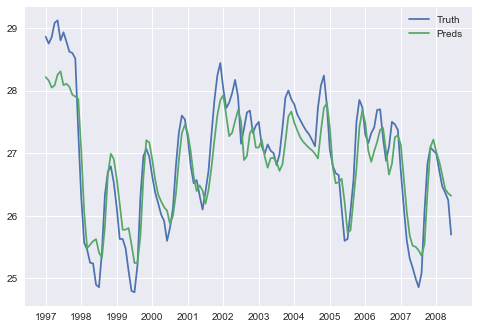

Test MRSE: 0.41013697720344117
Test RE: 0.015738669039898675
Test ERROR: 0.42399955257809485


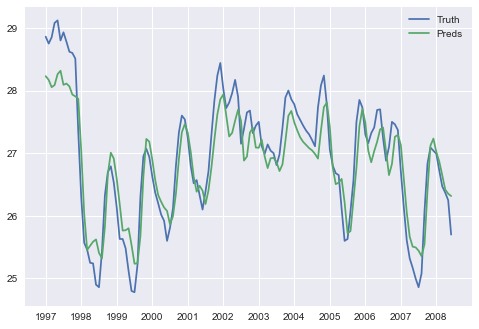

Test MRSE: 0.40696418581761884
Test RE: 0.015616915781037233
Test ERROR: 0.42071952126469037


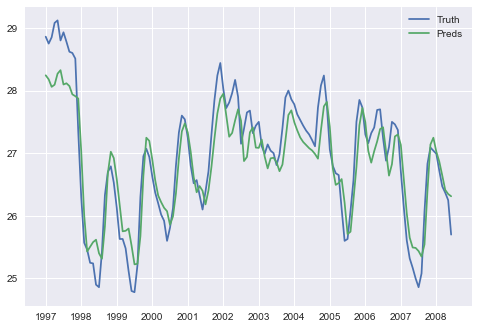

Test MRSE: 0.4040274709561133
Test RE: 0.015504221764552928
Test ERROR: 0.4176835458307804


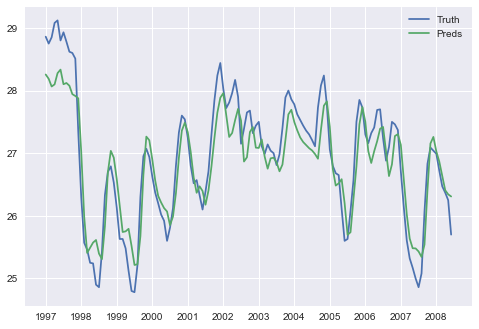

Test MRSE: 0.40128380802077396
Test RE: 0.015398935956892325
Test ERROR: 0.41484714745250884
epoch:  71 loss: 102.58220456


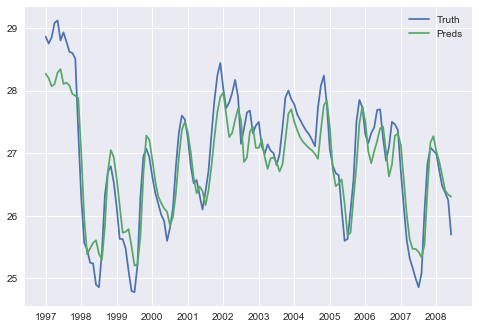

Test MRSE: 0.3987022154231349
Test RE: 0.015299869465089662
Test ERROR: 0.4121782973678336


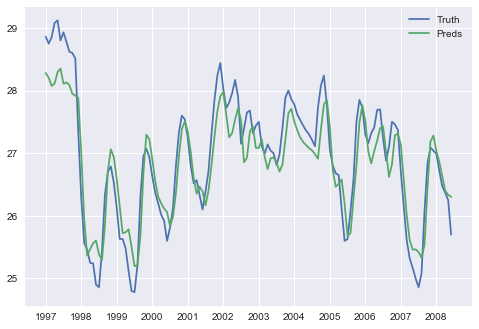

Test MRSE: 0.3962578800972857
Test RE: 0.015206070108156793
Test ERROR: 0.4096513438325107


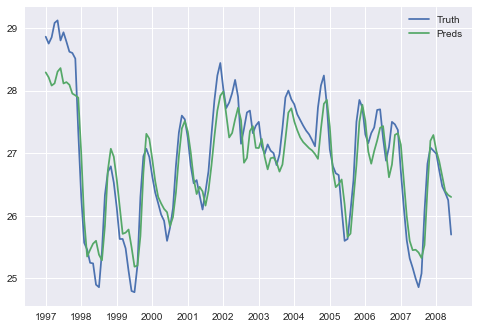

Test MRSE: 0.39393327936640293
Test RE: 0.01511686546778826
Test ERROR: 0.4072481719055666


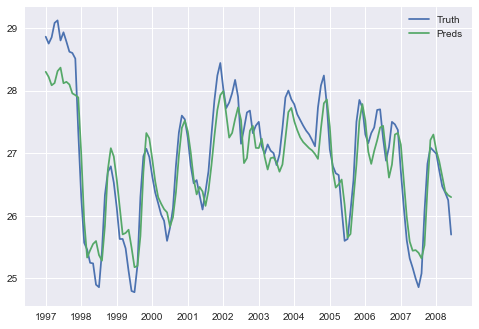

Test MRSE: 0.39171437251721514
Test RE: 0.015031716743164954
Test ERROR: 0.40495426629948567


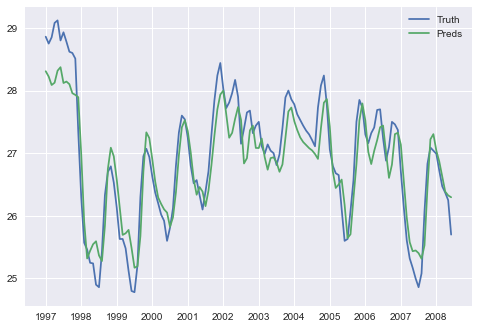

Test MRSE: 0.38959950453108777
Test RE: 0.014950560424308522
Test ERROR: 0.402767916056223
epoch:  76 loss: 96.17054488


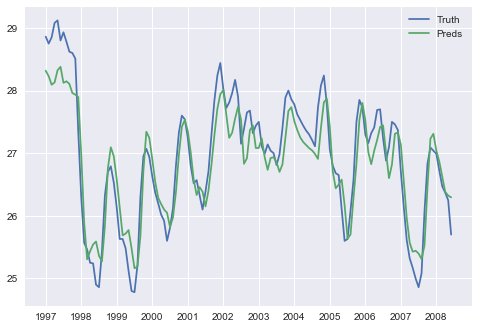

Test MRSE: 0.3875848226580337
Test RE: 0.014873248665108245
Test ERROR: 0.40068513820335355


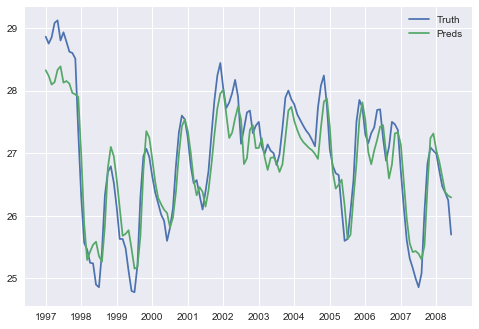

Test MRSE: 0.3856578569322589
Test RE: 0.014799302940887058
Test ERROR: 0.3986930412918952


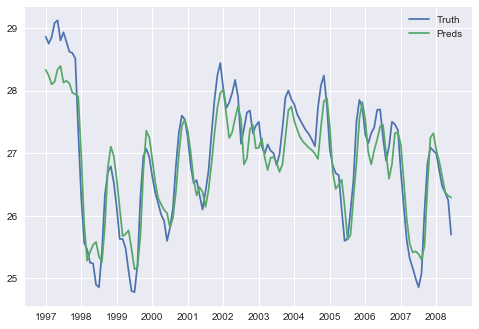

Test MRSE: 0.38380297780915906
Test RE: 0.01472812348073074
Test ERROR: 0.3967754675007112


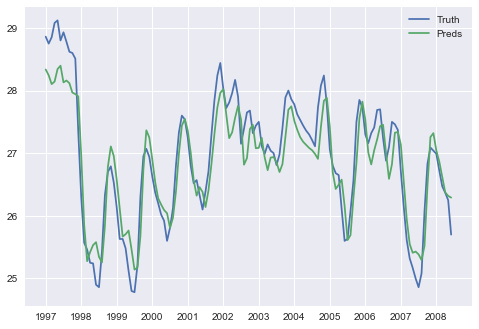

Test MRSE: 0.38200963368099694
Test RE: 0.014659305375374222
Test ERROR: 0.39492150857912356


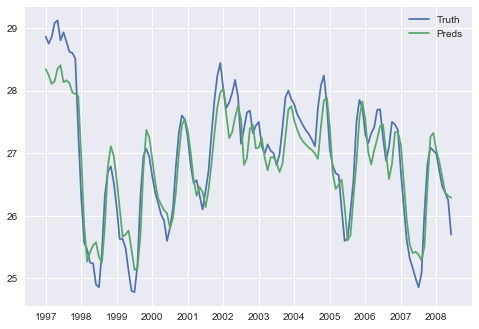

Test MRSE: 0.3802658949682168
Test RE: 0.014592390837017704
Test ERROR: 0.3931188317293715
epoch:  81 loss: 91.40580646


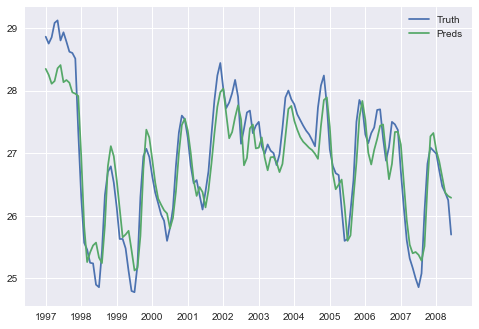

Test MRSE: 0.37857004480251244
Test RE: 0.014527313982252573
Test ERROR: 0.3913656620532283


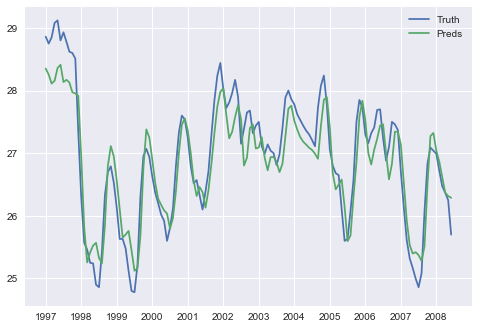

Test MRSE: 0.37692209213915534
Test RE: 0.014464075154730003
Test ERROR: 0.3896620088086522


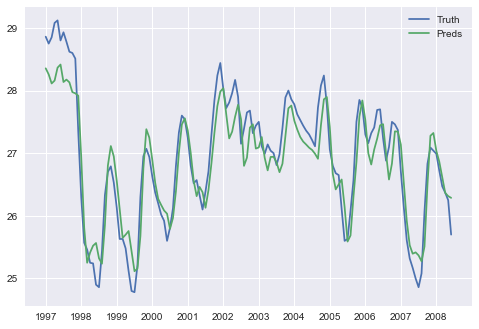

Test MRSE: 0.37531540155526566
Test RE: 0.014402419725556597
Test ERROR: 0.38800101229635103


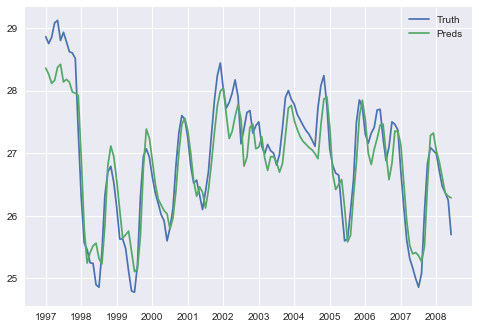

Test MRSE: 0.3737375605901374
Test RE: 0.014341871376765725
Test ERROR: 0.38636984051609496


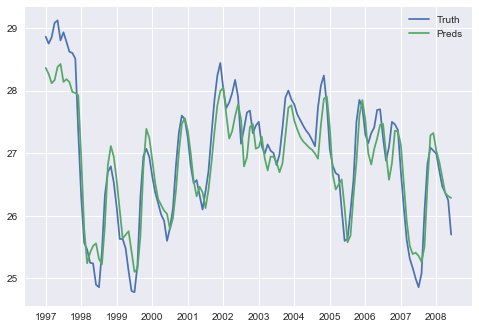

Test MRSE: 0.3721847314472077
Test RE: 0.014282282836072021
Test ERROR: 0.38476452595430694
epoch:  86 loss: 87.48303685


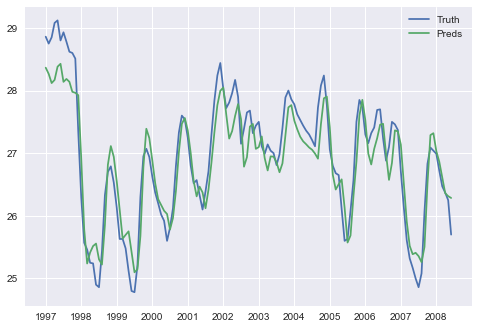

Test MRSE: 0.3706504696898363
Test RE: 0.01422340680352189
Test ERROR: 0.3831784063532438


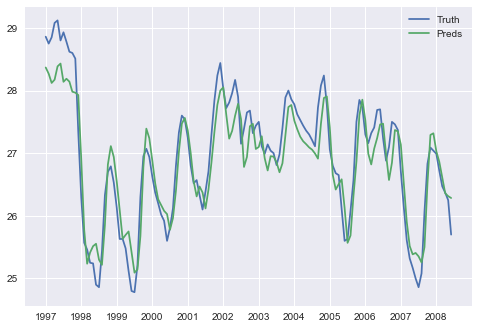

Test MRSE: 0.36913190042337385
Test RE: 0.014165132957398626
Test ERROR: 0.38160850964719883


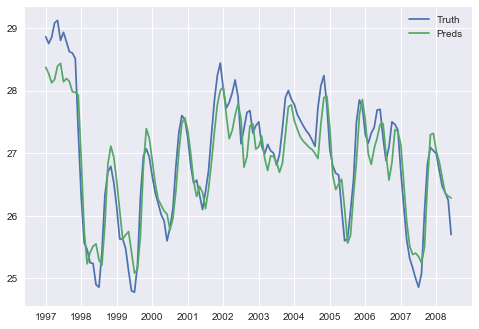

Test MRSE: 0.3676275898188581
Test RE: 0.014107406275695556
Test ERROR: 0.3800533535439813


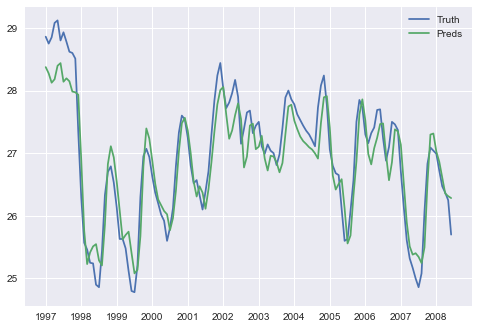

Test MRSE: 0.36613788713610096
Test RE: 0.014050240160970586
Test ERROR: 0.3785132991083381


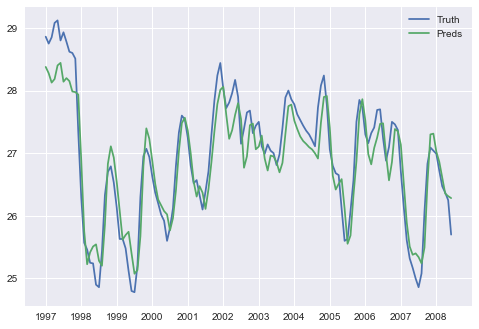

Test MRSE: 0.36466136115189246
Test RE: 0.013993579691210647
Test ERROR: 0.37698686674190507
epoch:  91 loss: 83.94838215


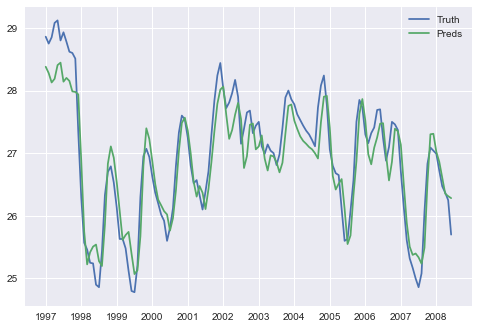

Test MRSE: 0.36319710598194965
Test RE: 0.01393739010385174
Test ERROR: 0.3754731199416307


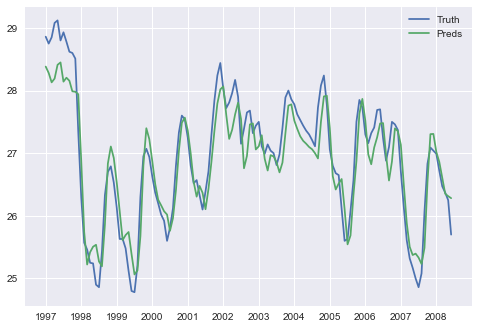

Test MRSE: 0.36174543003594545
Test RE: 0.013881683233861306
Test ERROR: 0.3739723775413939


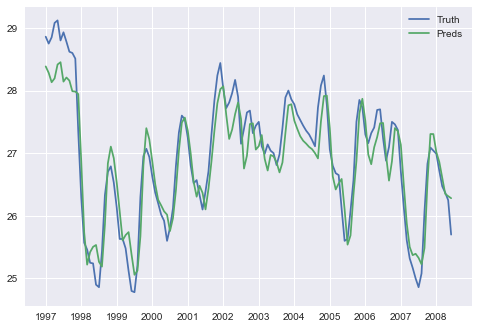

Test MRSE: 0.3603076888606909
Test RE: 0.013826511099232877
Test ERROR: 0.372486040905308


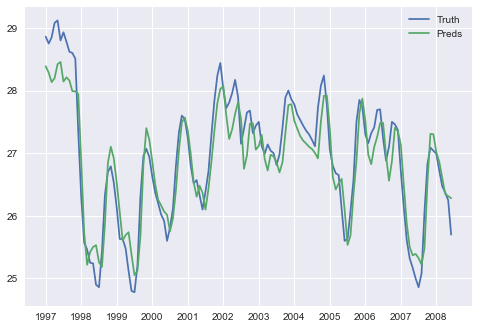

Test MRSE: 0.35888028318494763
Test RE: 0.01377173558089415
Test ERROR: 0.3710103891072445


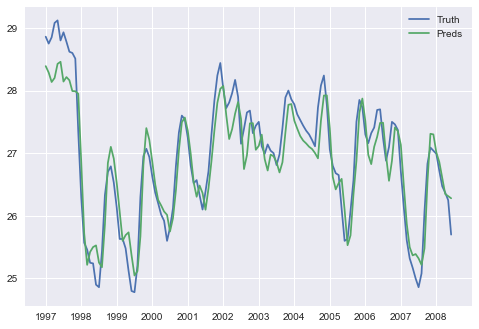

Test MRSE: 0.3574628461117506
Test RE: 0.013717342599475981
Test ERROR: 0.36954504284916967
epoch:  96 loss: 80.65369379


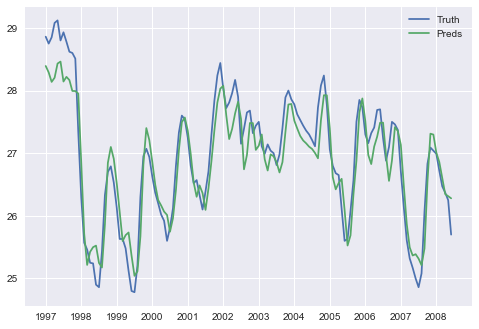

Test MRSE: 0.35605345479661615
Test RE: 0.013663258367403423
Test ERROR: 0.3680880142947118


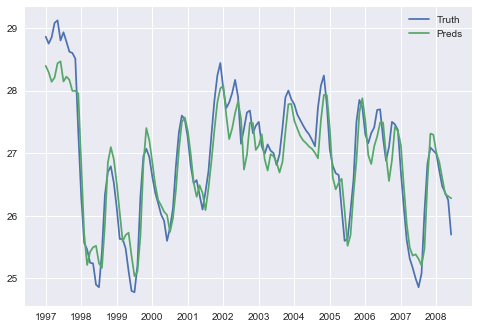

Test MRSE: 0.354652310228298
Test RE: 0.013609490597454523
Test ERROR: 0.3666395112260176


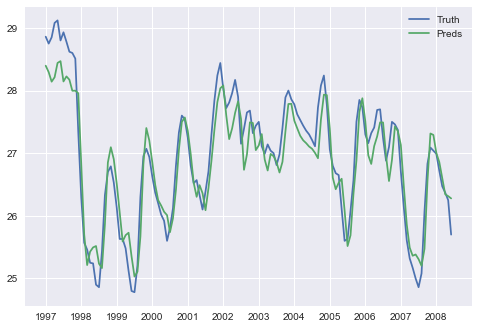

Test MRSE: 0.3532620783085983
Test RE: 0.013556141591417444
Test ERROR: 0.3652022896520164


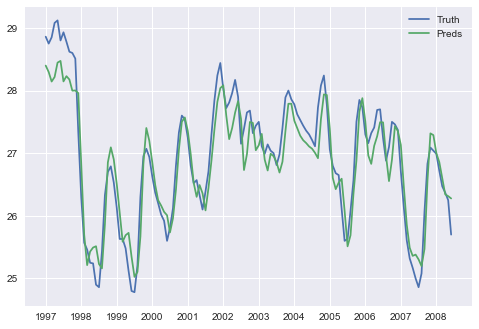

Test MRSE: 0.3518864265014674
Test RE: 0.013503352085203688
Test ERROR: 0.36378014099645284


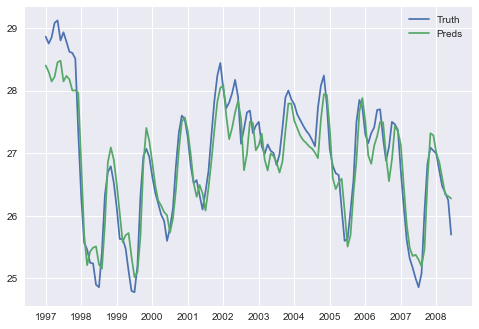

Test MRSE: 0.3505266225980426
Test RE: 0.013451170729255018
Test ERROR: 0.3623743759016366
epoch: 101 loss: 77.60929245


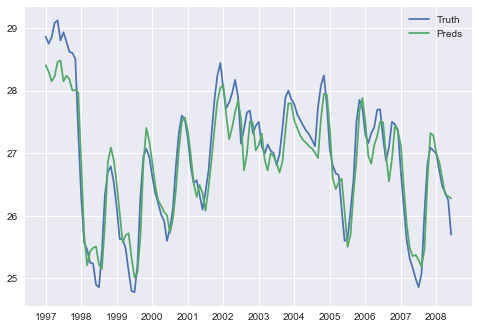

Test MRSE: 0.3491858650916685
Test RE: 0.013399720263121808
Test ERROR: 0.3609883009695625


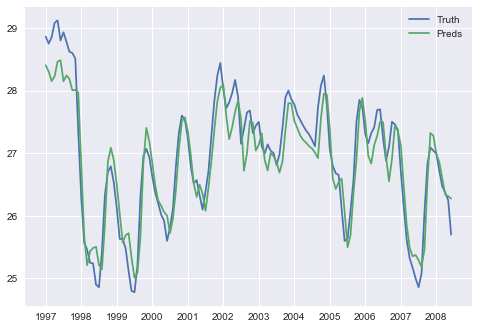

Test MRSE: 0.3478653030517119
Test RE: 0.013349044781395565
Test ERROR: 0.3596231041079895


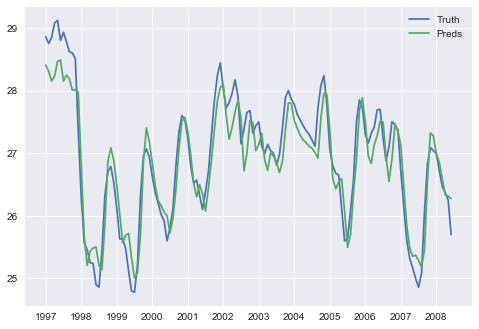

Test MRSE: 0.34656643411786314
Test RE: 0.013299201754767141
Test ERROR: 0.3582803335766303


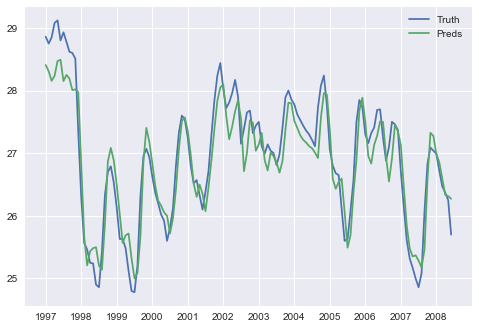

Test MRSE: 0.3452906877663093
Test RE: 0.013250246038209049
Test ERROR: 0.3569614671677777


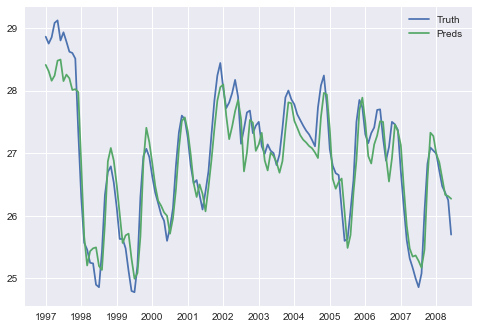

Test MRSE: 0.34404049142451815
Test RE: 0.013202270782253079
Test ERROR: 0.35566901435562537
epoch: 106 loss: 74.88456575


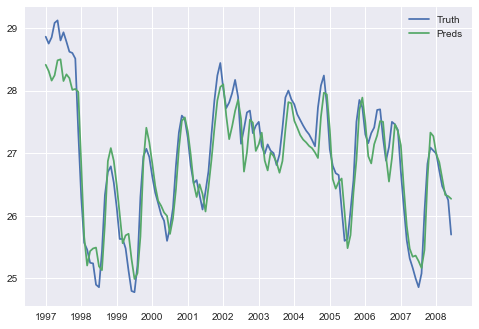

Test MRSE: 0.3428155605676232
Test RE: 0.013155265068491587
Test ERROR: 0.35440268099840433


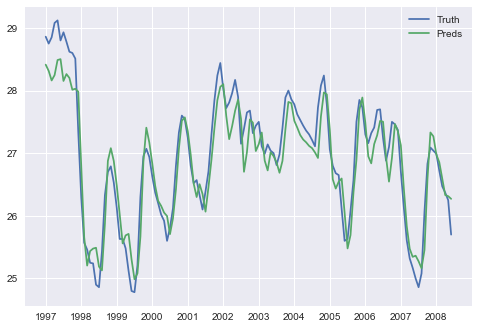

Test MRSE: 0.3416168869395975
Test RE: 0.01310926695428353
Test ERROR: 0.353163492360902


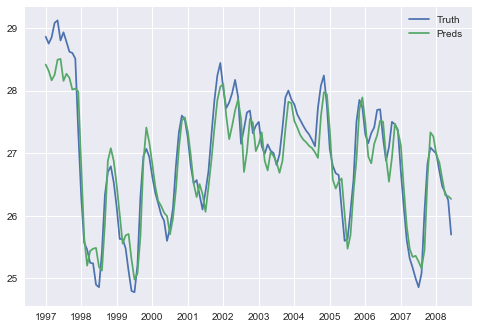

Test MRSE: 0.3404447090598695
Test RE: 0.013064285592615722
Test ERROR: 0.35195169502447193


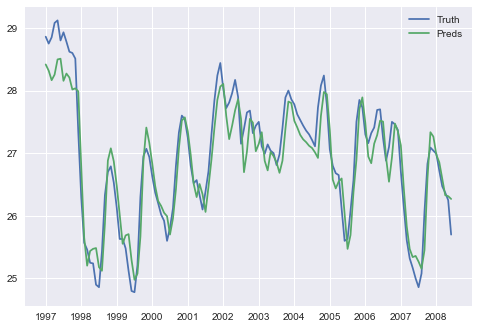

Test MRSE: 0.33929843588951597
Test RE: 0.013020298302855792
Test ERROR: 0.35076667797315375


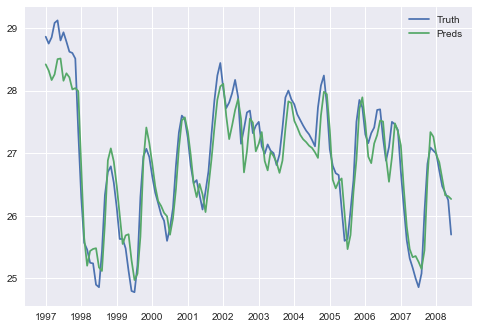

Test MRSE: 0.3381735448063069
Test RE: 0.01297713153309687
Test ERROR: 0.3496037657206865
epoch: 111 loss: 72.51413689


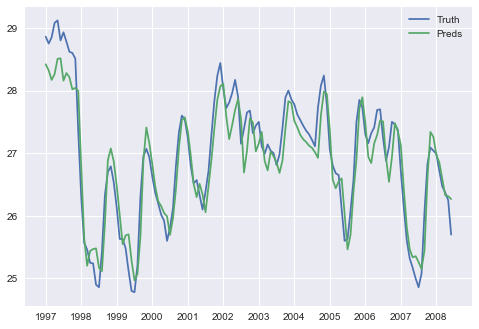

Test MRSE: 0.3370670170260586
Test RE: 0.012934669439979764
Test ERROR: 0.3484598374483821


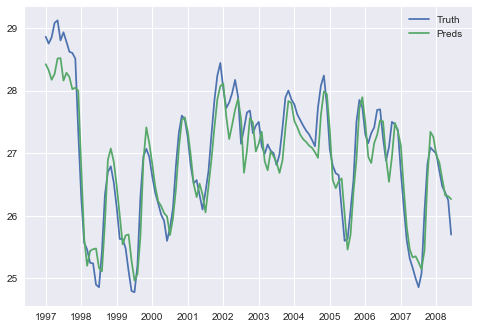

Test MRSE: 0.3359784576856206
Test RE: 0.012892896870955963
Test ERROR: 0.34733448494676783


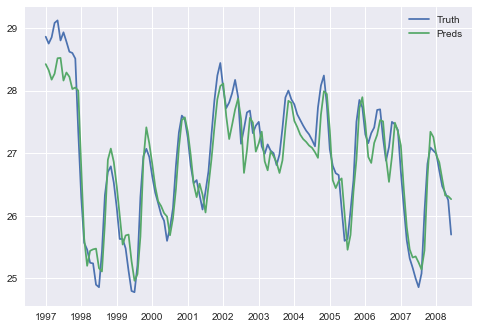

Test MRSE: 0.3349074072630775
Test RE: 0.012851796192250057
Test ERROR: 0.34622723316214854


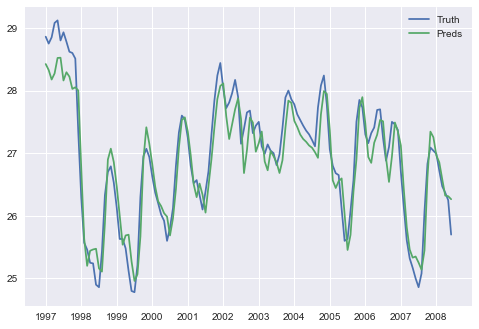

Test MRSE: 0.33385467127730506
Test RE: 0.012811398314986127
Test ERROR: 0.34513891483983117


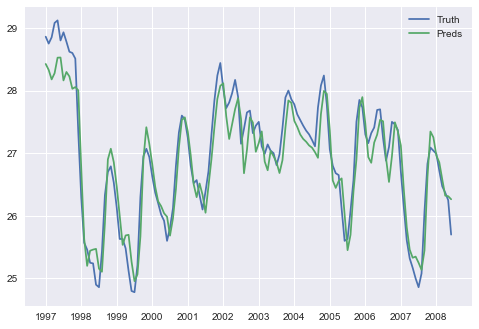

Test MRSE: 0.3328172668452095
Test RE: 0.012771588773479762
Test ERROR: 0.34406644627566935
epoch: 116 loss: 70.43661627


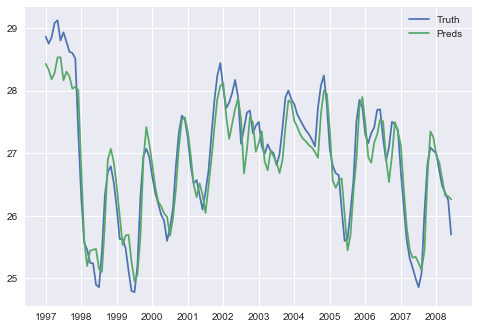

Test MRSE: 0.33179778148667277
Test RE: 0.01273246686167742
Test ERROR: 0.34301250244737347


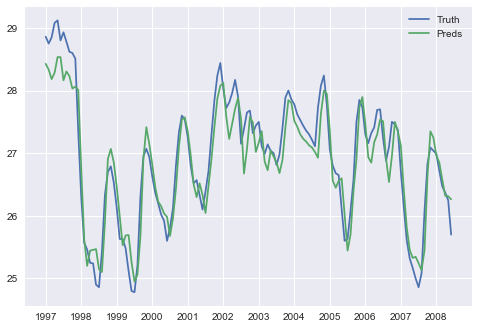

Test MRSE: 0.3307934203559553
Test RE: 0.012693925329673443
Test ERROR: 0.3419741940437891


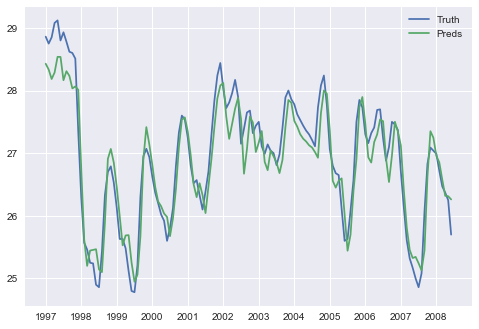

Test MRSE: 0.3298054889601669
Test RE: 0.012656014275229001
Test ERROR: 0.34095287069799296


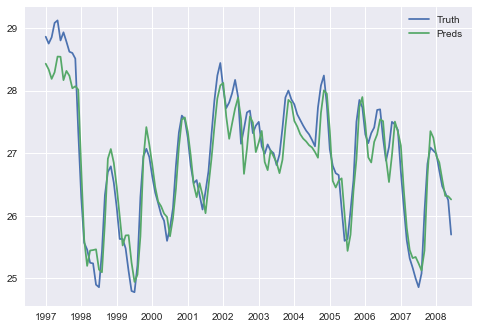

Test MRSE: 0.3288322371022793
Test RE: 0.012618666535973194
Test ERROR: 0.3399467230565296


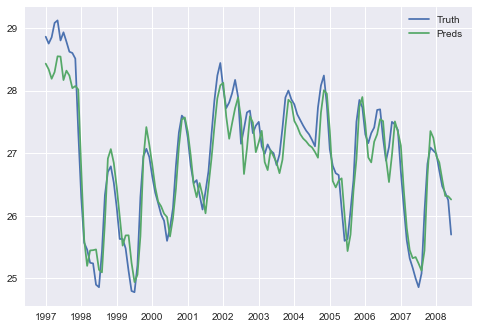

Test MRSE: 0.3278744118231797
Test RE: 0.012581910778985402
Test ERROR: 0.33895652341016913
epoch: 121 loss: 68.58371851


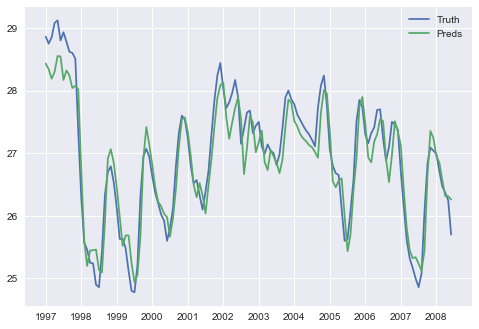

Test MRSE: 0.3269308406324793
Test RE: 0.012545702010911678
Test ERROR: 0.3379810596385031


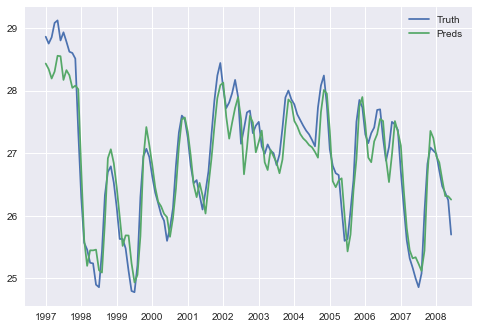

Test MRSE: 0.3260023148519884
Test RE: 0.012510070598075398
Test ERROR: 0.3370211498099141


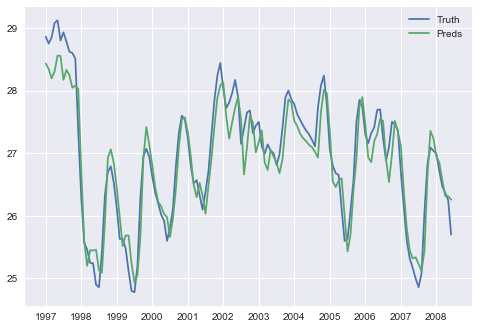

Test MRSE: 0.3250889840104608
Test RE: 0.012475022278519456
Test ERROR: 0.33607694850720793


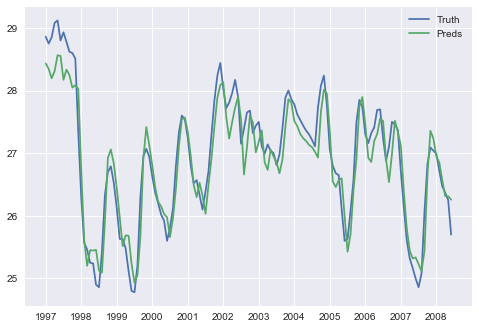

Test MRSE: 0.32419026609039814
Test RE: 0.012440534717801231
Test ERROR: 0.3351478540407719


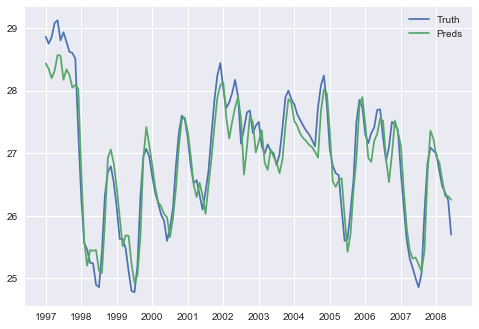

Test MRSE: 0.3233079906828191
Test RE: 0.012406678124970686
Test ERROR: 0.33423575784155846
epoch: 126 loss: 66.90971236


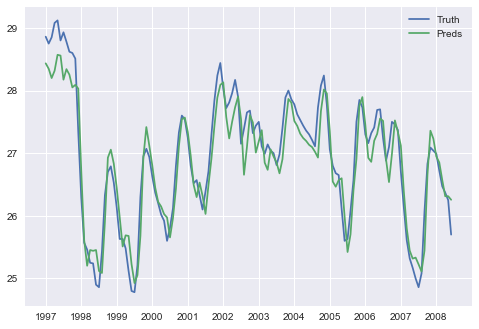

Test MRSE: 0.3224421070534397
Test RE: 0.012373450553141409
Test ERROR: 0.3333406074604713


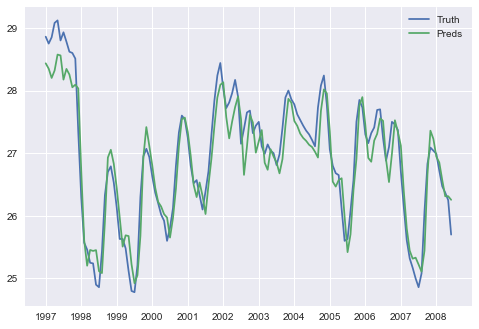

Test MRSE: 0.32159289446806005
Test RE: 0.012340862718908708
Test ERROR: 0.3324626916024578


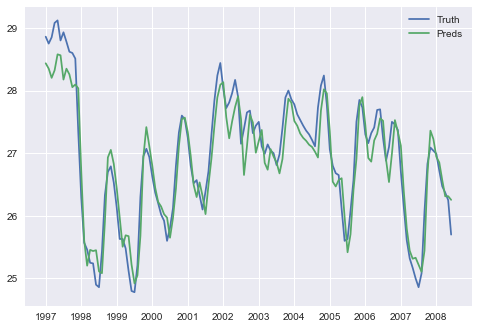

Test MRSE: 0.3207630073777788
Test RE: 0.01230901648464941
Test ERROR: 0.331604754438711


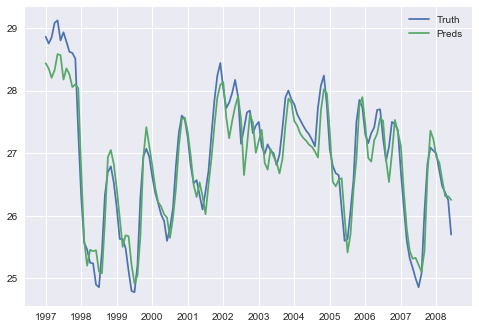

Test MRSE: 0.31995416321094916
Test RE: 0.012277977755263472
Test ERROR: 0.3307685714464346


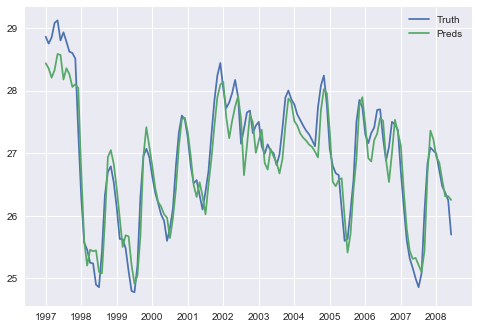

Test MRSE: 0.31916805198710346
Test RE: 0.012247811383859901
Test ERROR: 0.3299558897675967
epoch: 131 loss: 65.38242503


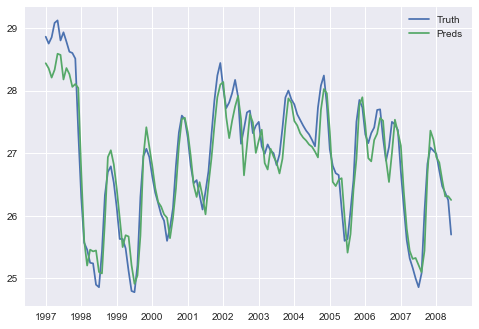

Test MRSE: 0.3184077966371203
Test RE: 0.01221863721034162
Test ERROR: 0.32916993788772503


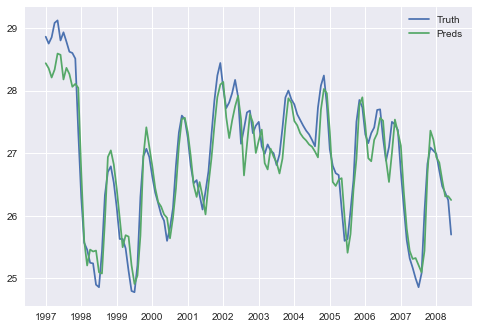

Test MRSE: 0.3176733916780891
Test RE: 0.01219045502430644
Test ERROR: 0.32841071013858714


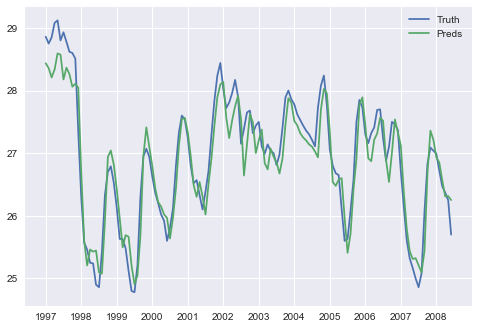

Test MRSE: 0.3169656643090676
Test RE: 0.012163296568837592
Test ERROR: 0.3276790616784593


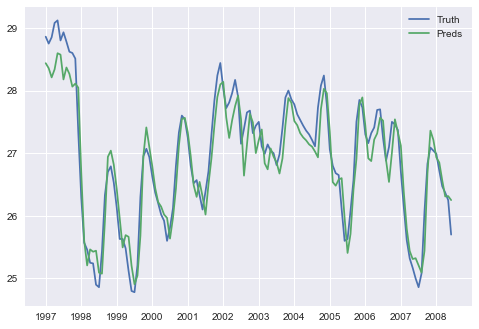

Test MRSE: 0.3162831840118144
Test RE: 0.012137106948974588
Test ERROR: 0.32697351363777344


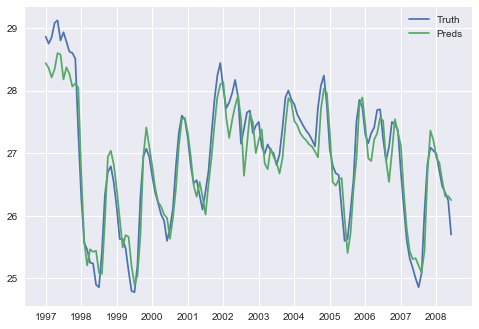

Test MRSE: 0.3156210506122211
Test RE: 0.012111698124567877
Test ERROR: 0.3262890002171868
epoch: 136 loss: 64.06328227


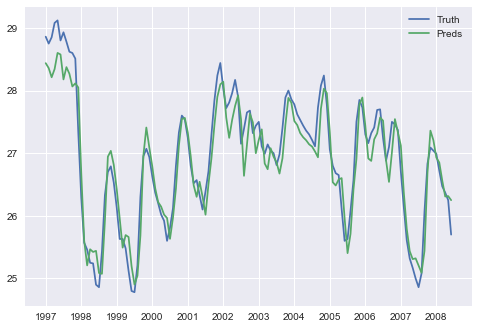

Test MRSE: 0.3149770568968733
Test RE: 0.012086985395618772
Test ERROR: 0.3256232395997648


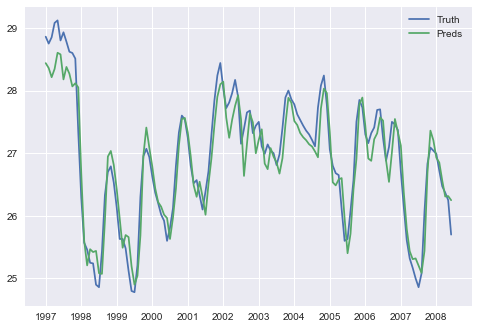

Test MRSE: 0.3143509555425958
Test RE: 0.012062959271303924
Test ERROR: 0.32497597610284157


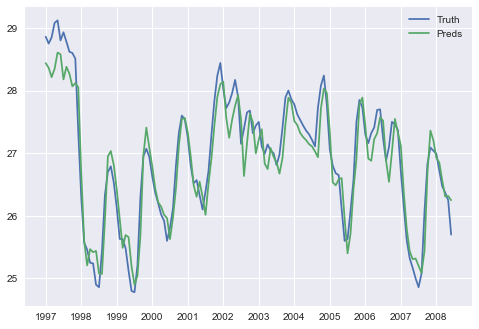

Test MRSE: 0.3137398508740327
Test RE: 0.012039508632464108
Test ERROR: 0.32434421617761877


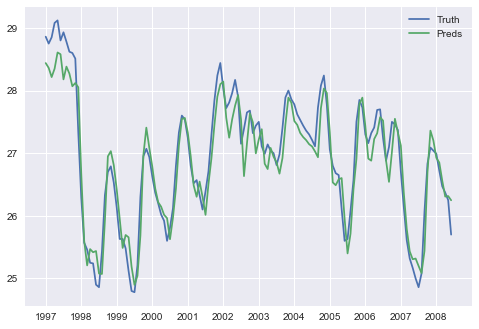

Test MRSE: 0.31314404271926866
Test RE: 0.012016644984755376
Test ERROR: 0.32372826978633057


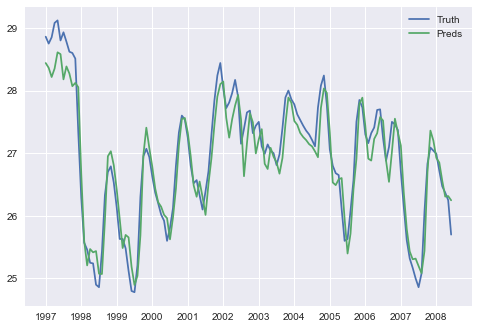

Test MRSE: 0.3125598882723061
Test RE: 0.011994228538494866
Test ERROR: 0.32312437099662017
epoch: 141 loss: 62.96417296


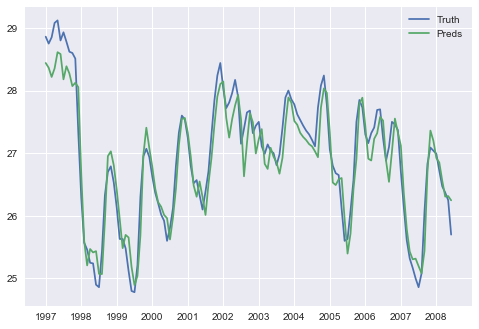

Test MRSE: 0.31199016580935196
Test RE: 0.01197236590774606
Test ERROR: 0.3225353919900616


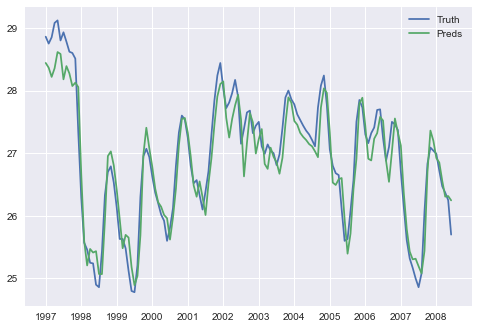

Test MRSE: 0.3114327384857246
Test RE: 0.011950975092852487
Test ERROR: 0.3219591236969065


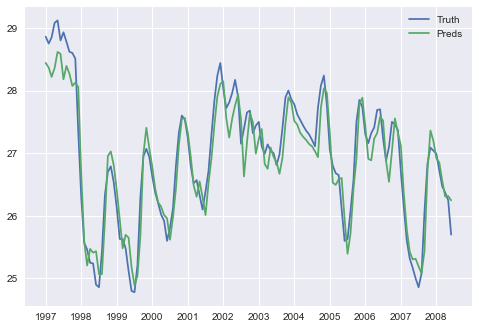

Test MRSE: 0.3108876348600518
Test RE: 0.011930057189727996
Test ERROR: 0.32139559564106057


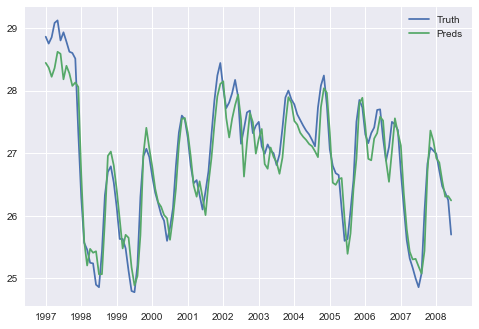

Test MRSE: 0.3103562392783415
Test RE: 0.011909665321511602
Test ERROR: 0.3208462389592431


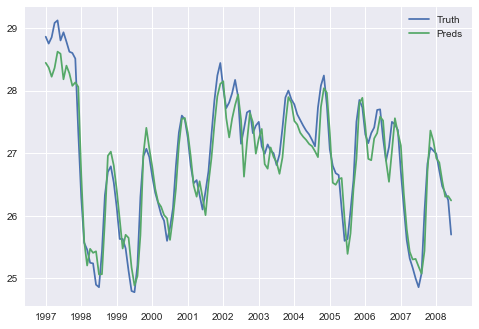

Test MRSE: 0.30983716827012764
Test RE: 0.011889746398662488
Test ERROR: 0.32030962341986985
epoch: 146 loss: 62.00958277


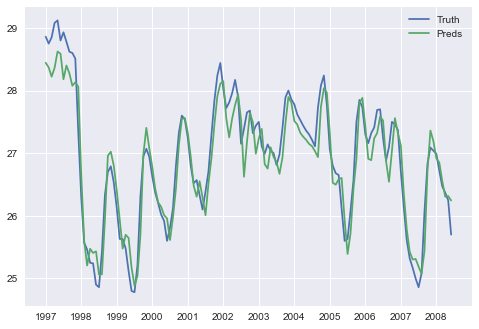

Test MRSE: 0.30932981661265874
Test RE: 0.011870277196255542
Test ERROR: 0.3197851233437407


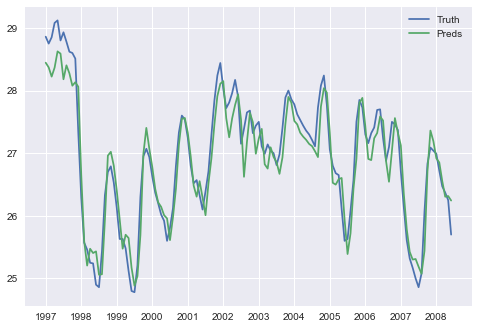

Test MRSE: 0.30883517410079
Test RE: 0.011851295696853928
Test ERROR: 0.3192737619806456


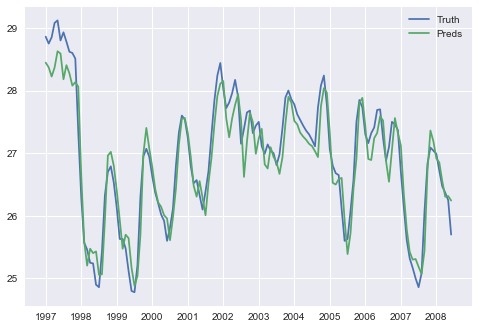

Test MRSE: 0.3083530365816462
Test RE: 0.01183279406625904
Test ERROR: 0.31877532827736926


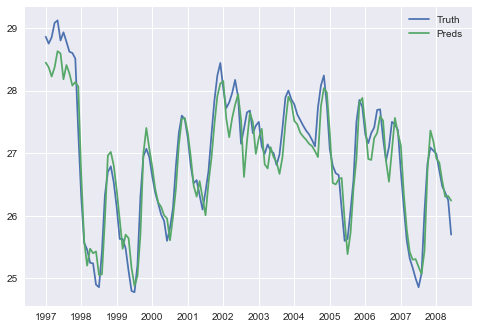

Test MRSE: 0.30788320279864356
Test RE: 0.011814764581415067
Test ERROR: 0.31828961417488205


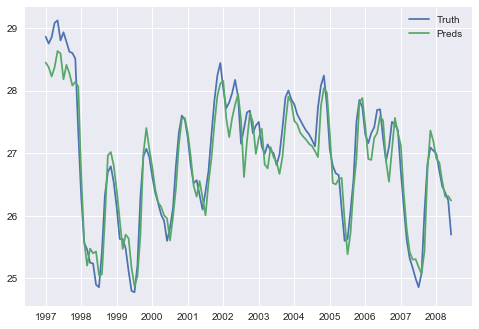

Test MRSE: 0.30742490038249115
Test RE: 0.011797177603285976
Test ERROR: 0.3178158211979135
epoch: 151 loss: 61.17004069


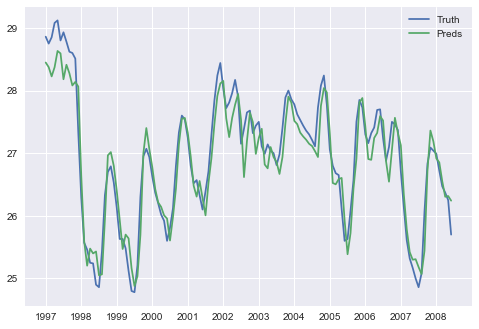

Test MRSE: 0.30697867953683433
Test RE: 0.011780054245483949
Test ERROR: 0.3173545181469193


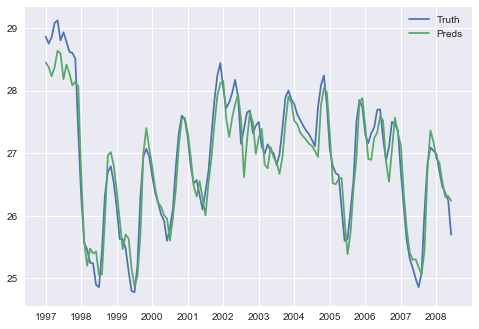

Test MRSE: 0.3065433358872268
Test RE: 0.011763348291130567
Test ERROR: 0.31690445993975663


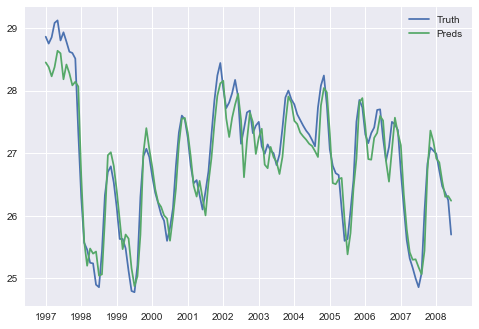

Test MRSE: 0.3061210051559598
Test RE: 0.011747141696811488
Test ERROR: 0.31646785448584663


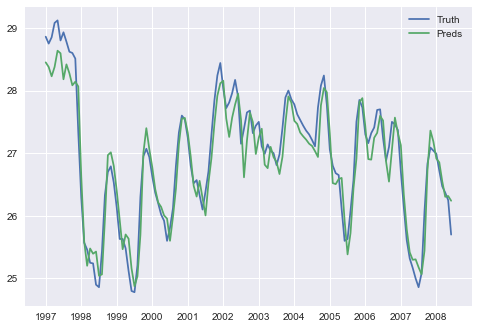

Test MRSE: 0.3057104533361603
Test RE: 0.011731387108528299
Test ERROR: 0.3160434260690478


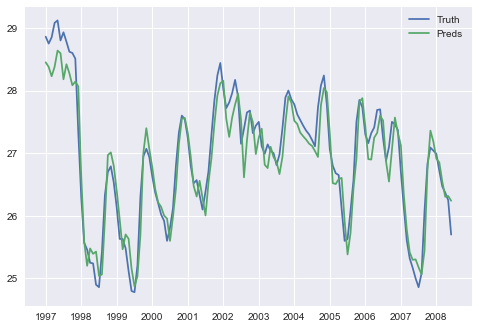

Test MRSE: 0.30531163274931117
Test RE: 0.01171608269665713
Test ERROR: 0.3156311253993154
epoch: 156 loss: 60.42920436


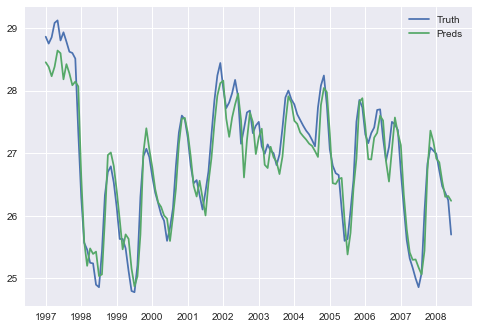

Test MRSE: 0.30492510530023076
Test RE: 0.011701250023833059
Test ERROR: 0.31523153337377624


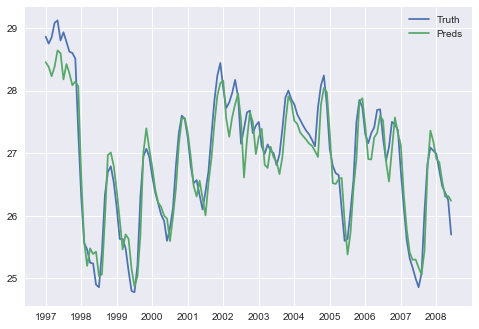

Test MRSE: 0.3045505524491077
Test RE: 0.011686876866352912
Test ERROR: 0.3148443206860155


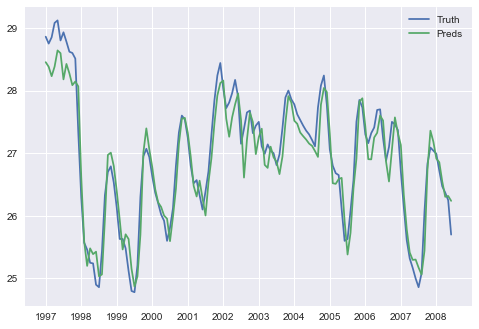

Test MRSE: 0.3041886033066277
Test RE: 0.011672987365821626
Test ERROR: 0.3144701377105765


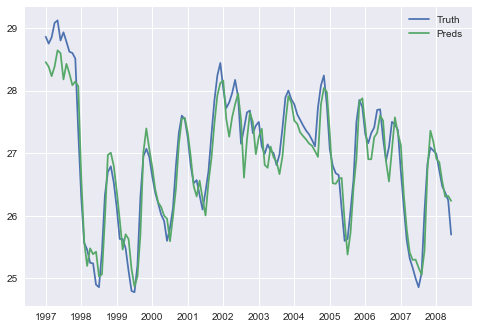

Test MRSE: 0.30383756728589784
Test RE: 0.011659516647358193
Test ERROR: 0.3141072367189538


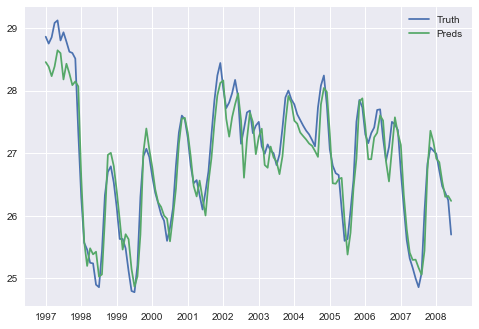

Test MRSE: 0.30349800684367567
Test RE: 0.011646486294777901
Test ERROR: 0.3137561991788687
epoch: 161 loss: 59.77597209


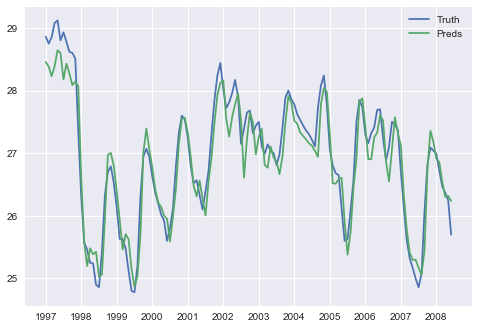

Test MRSE: 0.30316619182156607
Test RE: 0.011633753166321504
Test ERROR: 0.31341316885306764


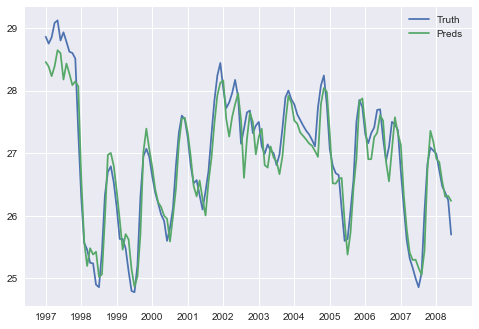

Test MRSE: 0.3028413441124337
Test RE: 0.01162128740276791
Test ERROR: 0.3130773413344974


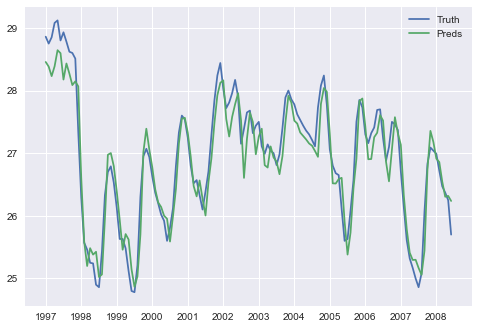

Test MRSE: 0.3025211266337084
Test RE: 0.011608999320496438
Test ERROR: 0.3127463005475072


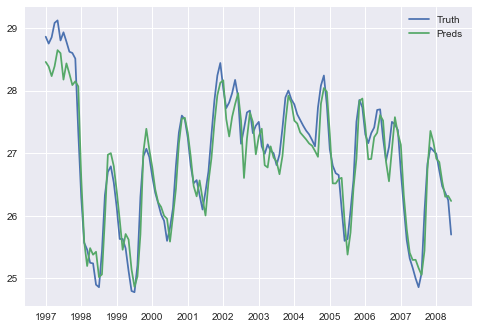

Test MRSE: 0.30220166306927276
Test RE: 0.011596740169065515
Test ERROR: 0.3124160391570095


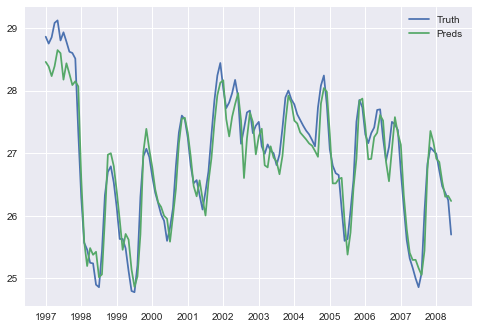

Test MRSE: 0.3018818898002534
Test RE: 0.011584469132976014
Test ERROR: 0.31208545759395434
epoch: 166 loss: 59.20575024


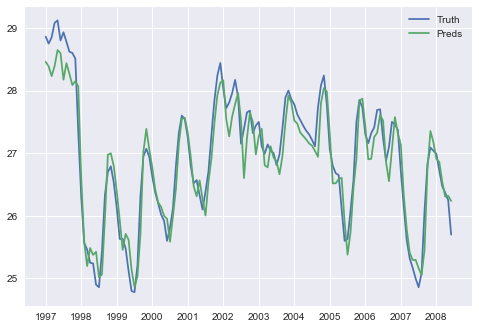

Test MRSE: 0.3015618023495988
Test RE: 0.01157218604042477
Test ERROR: 0.31175455122996637


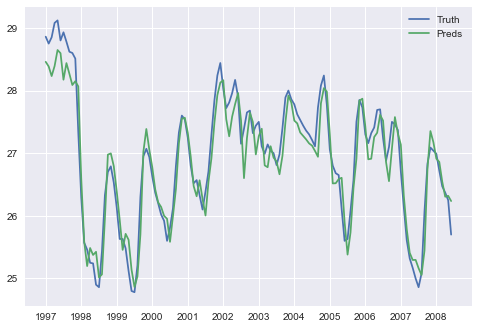

Test MRSE: 0.3012403126646226
Test RE: 0.01155984913828519
Test ERROR: 0.31142219523632286


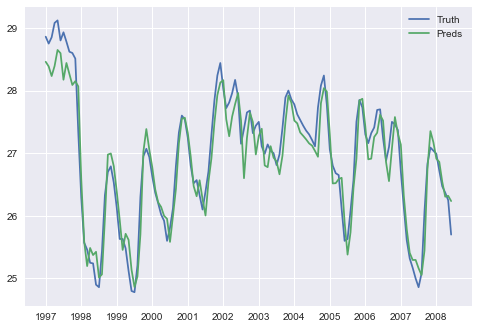

Test MRSE: 0.3009187421015312
Test RE: 0.011547509132514486
Test ERROR: 0.31108975563089464


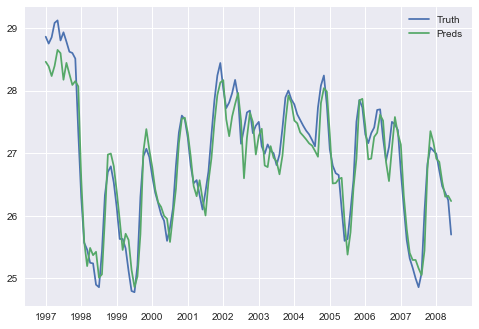

Test MRSE: 0.300595420391048
Test RE: 0.011535101927903465
Test ERROR: 0.31075550568952526


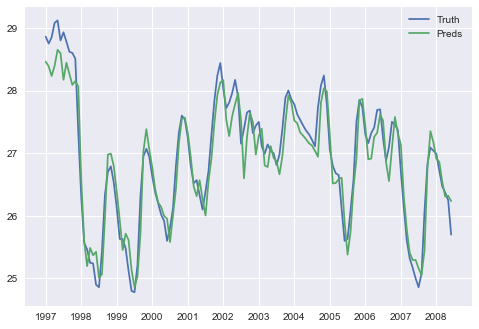

Test MRSE: 0.3002731790105347
Test RE: 0.011522736180066143
Test ERROR: 0.3104223725931353
epoch: 171 loss: 58.68214661


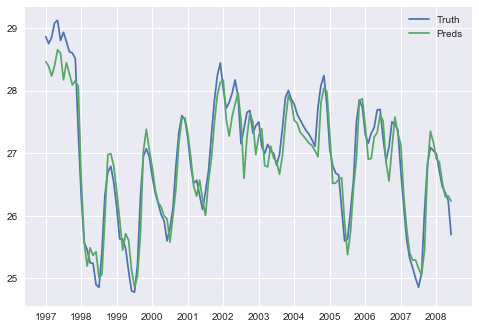

Test MRSE: 0.29995082239234505
Test RE: 0.01151036601007781
Test ERROR: 0.3100891203640509


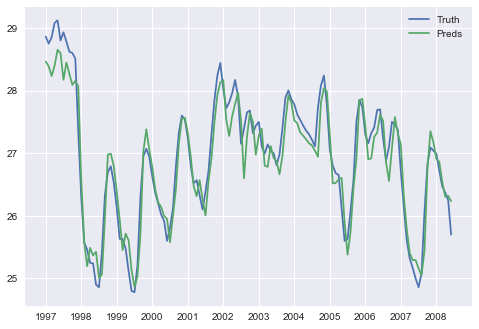

Test MRSE: 0.2996291844482348
Test RE: 0.011498023418615949
Test ERROR: 0.30975661110013436


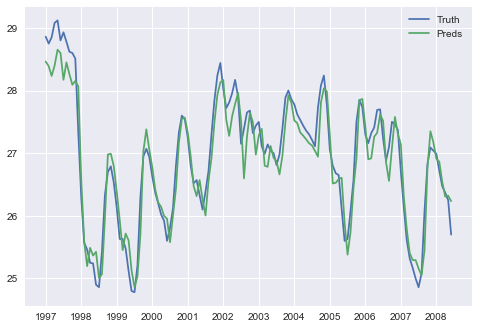

Test MRSE: 0.29930851372483785
Test RE: 0.011485717943453131
Test ERROR: 0.30942510174886273


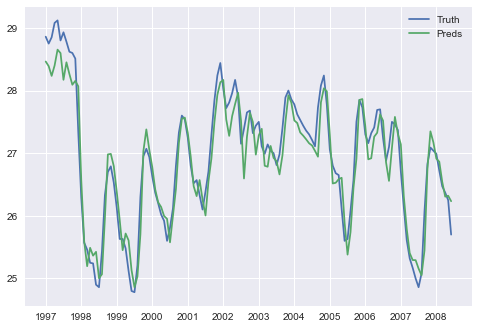

Test MRSE: 0.2989879266946692
Test RE: 0.01147341567994909
Test ERROR: 0.3090936789196395


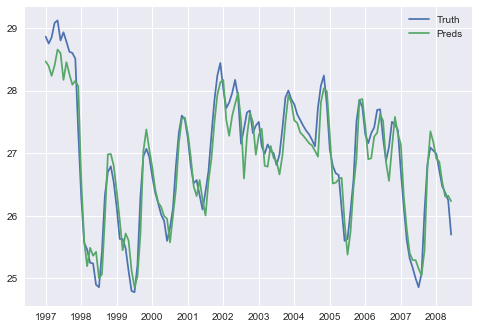

Test MRSE: 0.29866970832955003
Test RE: 0.011461204312017385
Test ERROR: 0.30876470481602986
epoch: 176 loss: 58.18370765


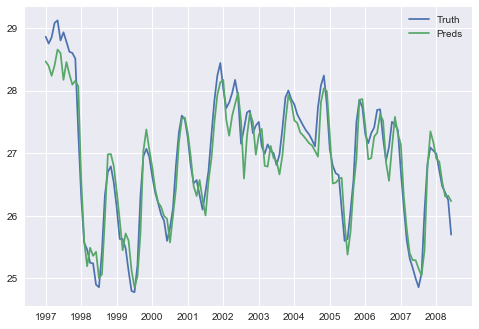

Test MRSE: 0.2983512113990946
Test RE: 0.011448982254370105
Test ERROR: 0.30843544273161255


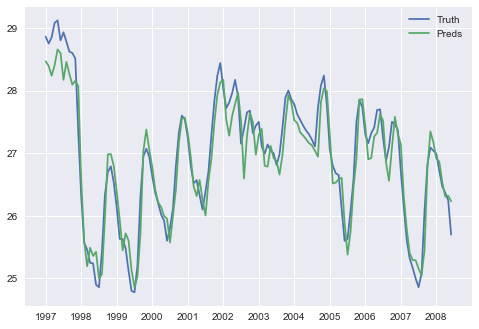

Test MRSE: 0.29803543031271734
Test RE: 0.011436864415004732
Test ERROR: 0.3081089882864428


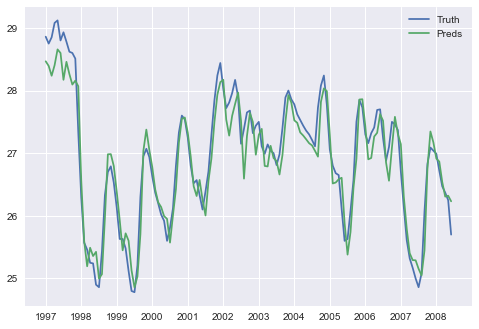

Test MRSE: 0.297719723128386
Test RE: 0.011424749411569565
Test ERROR: 0.30778261024119824


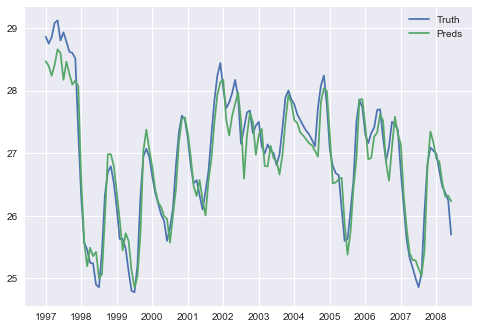

Test MRSE: 0.29740543300021444
Test RE: 0.011412688786498575
Test ERROR: 0.30745769714842347


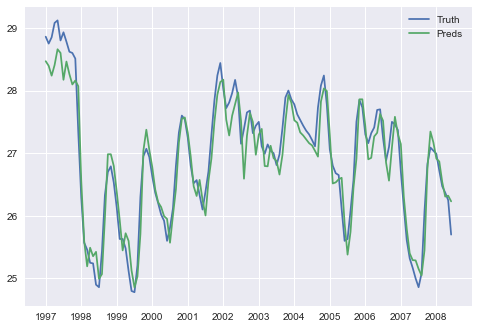

Test MRSE: 0.297091398530536
Test RE: 0.011400637972111901
Test ERROR: 0.3071330483553649
epoch: 181 loss: 57.71253053


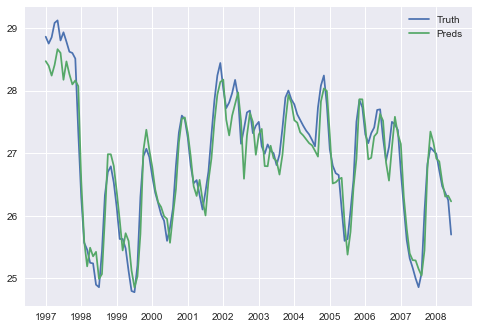

Test MRSE: 0.2967787527316408
Test RE: 0.011388640446823941
Test ERROR: 0.30680983516997773


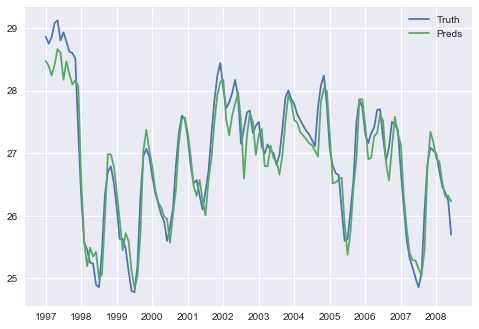

Test MRSE: 0.2964657269842168
Test RE: 0.01137662834132381
Test ERROR: 0.30648622919385204


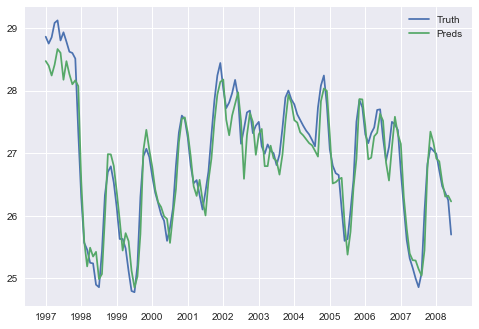

Test MRSE: 0.2961530482068149
Test RE: 0.011364629550512786
Test ERROR: 0.30616298191528896


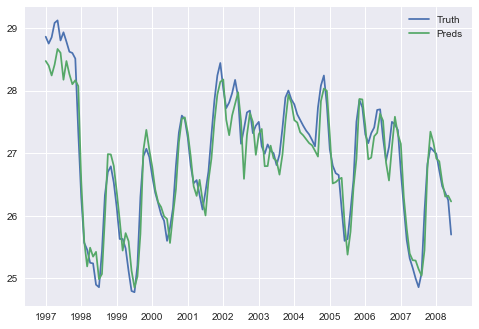

Test MRSE: 0.29584147319734966
Test RE: 0.011352673115888156
Test ERROR: 0.30584087571187235


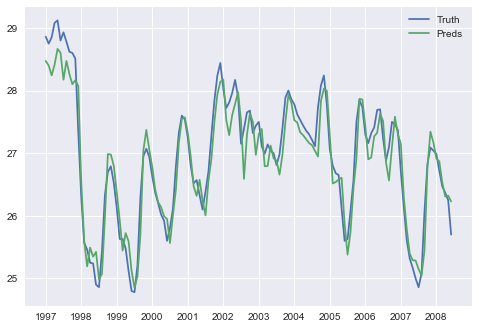

Test MRSE: 0.29552885432540116
Test RE: 0.01134067662389962
Test ERROR: 0.30551769036355914
epoch: 186 loss: 57.26954651


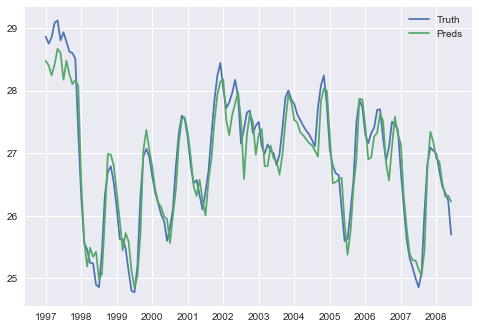

Test MRSE: 0.2952174745919118
Test RE: 0.011328727682829888
Test ERROR: 0.3051957860364204


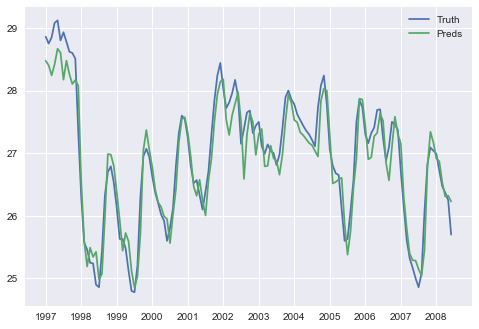

Test MRSE: 0.29490567862975464
Test RE: 0.011316762769327506
Test ERROR: 0.30487345141214023


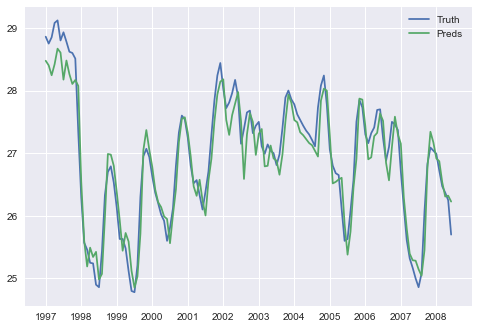

Test MRSE: 0.2945948308311998
Test RE: 0.011304834240823214
Test ERROR: 0.30455209699926616


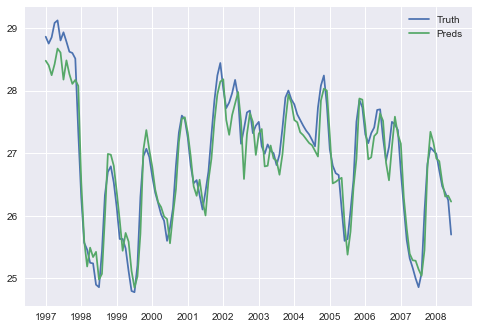

Test MRSE: 0.29428510708226574
Test RE: 0.011292948846798252
Test ERROR: 0.3042319046287409


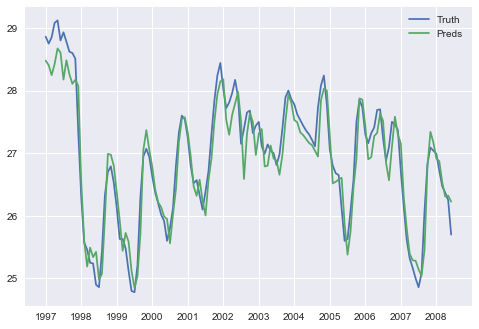

Test MRSE: 0.2939761472242445
Test RE: 0.011281092766458539
Test ERROR: 0.3039125019685398
epoch: 191 loss: 56.85318260


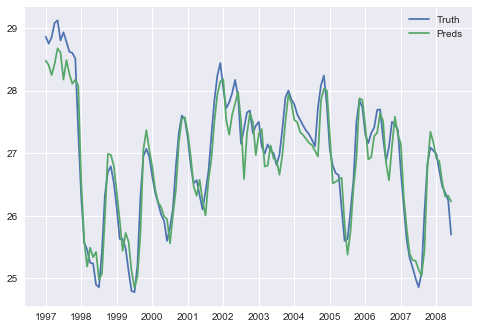

Test MRSE: 0.2936685317111725
Test RE: 0.01126928827425013
Test ERROR: 0.30359448909196884


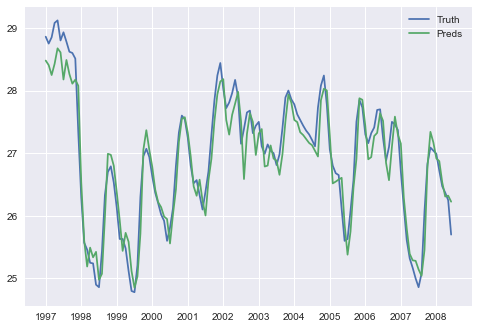

Test MRSE: 0.2933620809449464
Test RE: 0.01125752847824358
Test ERROR: 0.30327768033053243


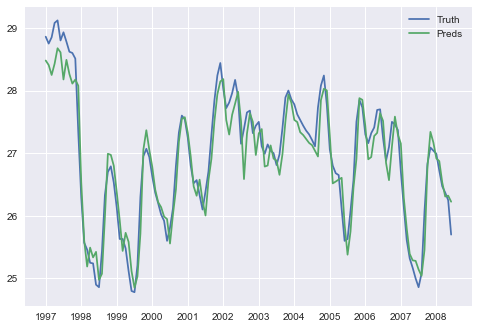

Test MRSE: 0.29305776449947385
Test RE: 0.011245850585039827
Test ERROR: 0.3029630780296077


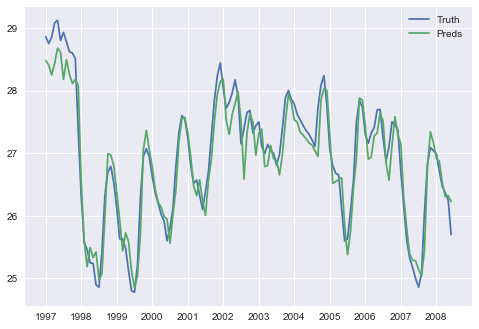

Test MRSE: 0.2927547278556801
Test RE: 0.01123422180317248
Test ERROR: 0.30264979878748854


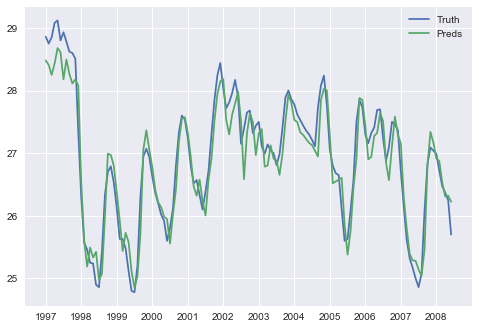

Test MRSE: 0.2924540112864318
Test RE: 0.011222682052256861
Test ERROR: 0.30233891803812646
epoch: 196 loss: 56.46474947


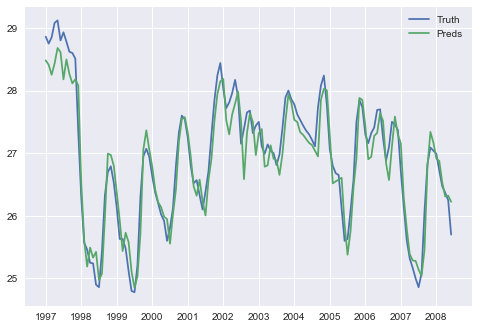

Test MRSE: 0.29215546443523216
Test RE: 0.011211225562486118
Test ERROR: 0.30203028034299506


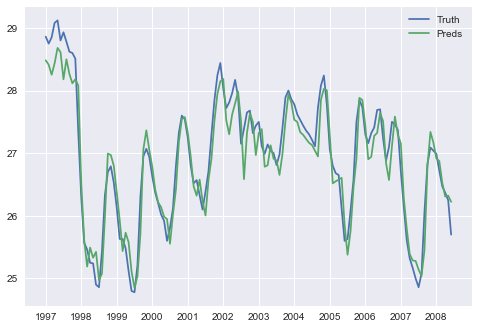

Test MRSE: 0.29185914009926933
Test RE: 0.011199854359908905
Test ERROR: 0.3017239402838204


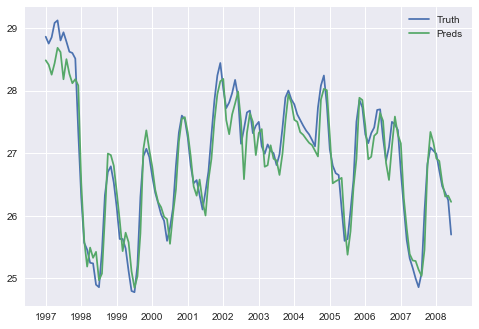

Test MRSE: 0.29156530426843436
Test RE: 0.011188578651668432
Test ERROR: 0.30142017284091643
epoch: 199 loss: 0.2186853141


In [124]:
layers = [1]
sizes = [64]
epochs = 200
p=6
loss_function = nn.MSELoss()
input_size=1
output_size=1
skip_cnt = 0
lr_threshold = 1e-5
best_test_metric = np.inf
best_path = None
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
    
def error(actuals, preds):
    actuals = np.array(actuals)
    preds = np.array(preds)
    return np.sqrt(np.mean(np.square(actuals-preds)))


for a,l in enumerate(layers):
    for b,s in enumerate(sizes):
        if (a*len(sizes))+(b)<skip_cnt:
            print(f'Skipping num_hidden_layers: {l} hidden_layer_size: {s}')
        else:
            num_hidden_layers=l
            hidden_layer_size=s
            prev_running_loss = np.inf
            model = LSTM(input_size,hidden_layer_size,num_hidden_layers,output_size)
            print(model)
            optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
            scheduler = ReduceLROnPlateau(optimizer, 'min', verbose=True, patience=4)
            #best_model_params = model.state_dict()
            #PATH = f'models/best_rnn_model_{p}_{l}_{s}.pth'

            for i in range(epochs):
                running_loss = 0.0
                cnt=0
                for seq, labels in train_inout_seq:
                    optimizer.zero_grad()
            #         model.hidden_cell = (torch.zeros(1, 1, model.hidden_layer_size),
            #                         torch.zeros(1, 1, model.hidden_layer_size))

                    y_pred = model(seq)
                    single_loss = loss_function(y_pred, labels)
                    single_loss.backward()
                    optimizer.step()
                    current_loss = single_loss.item()
                    running_loss += current_loss
                current_lr = get_lr(optimizer)
                if current_lr < lr_threshold:
                    print('LR lower than threshold {lr_threshold}. stopping training')
                    break
                    
#                 if running_loss > prev_running_loss:
#                     print('Training loss started to increase. stopping training...')
#                     prev_running_loss = running_loss
#                     cnt += 1
#                     if cnt > 4:   
#                         break
#                 else:
#                     cnt=0
                prev_running_loss = running_loss
                test_mrse,test_re,test_error,_,_ = evaluate(False,True)
                
                if i%5 == 1:
                    print(f'epoch: {i:3} loss: {running_loss:10.8f}')
                test_metric = test_error 
                scheduler.step(test_metric)
                if(test_metric < best_test_metric):
                    count = 0
                    best_test_metric = test_metric
                    #best_path = PATH
                    #torch.save({
                    #    'state_dict': model.state_dict(),
                    #    }, PATH)
                    #print(f"Best Model saved at epoch: {i} with metric: {best_test_metric} num_hidden_layers: {l} hidden_layer_size: {s}")
                else:
                    count+=1
            #     if(count >= 5):
            #         print("Validation has not improved since 5 epochs. Early Stopping...")
            #         break
            print(f'epoch: {i:3} loss: {single_loss.item():10.10f}')

In [ ]:
# 64 is the best